In [ ]:
import pandas as pd 

url="C:/Users/theProcess/Documents/Workspace/shell/Demand_History.csv"
df=pd.read_csv(url)
url_infrat="C:/Users/theProcess/Documents/Workspace/shell/exisiting_EV_infrastructure_2018.csv"
df_infrat=pd.read_csv(url_infrat)


,supply_point_index,x_coordinate,y_coordinate,total_parking_slots,existing_num_SCS,existing_num_FCS
0,0,50.163110,19.412014,23,5,3
1,1,37.336451,58.119225,27,4,7
2,2,46.709232,57.525650,31,6,14
3,3,30.528626,55.379835,26,5,5
4,4,51.521781,35.116755,32,11,6
...,...,...,...,...,...,...
95,95,45.471204,20.999414,24,3,4
96,96,30.318396,33.388335,32,5,10
97,97,36.218839,22.235766,32,4,14
98,98,42.936915,38.122442,28,7,5


In [ ]:
df_infrat.head(100)

,supply_point_index,x_coordinate,y_coordinate,total_parking_slots,existing_num_SCS,existing_num_FCS
0,0,50.163110,19.412014,23,5,3
1,1,37.336451,58.119225,27,4,7
2,2,46.709232,57.525650,31,6,14
3,3,30.528626,55.379835,26,5,5
4,4,51.521781,35.116755,32,11,6
...,...,...,...,...,...,...
95,95,45.471204,20.999414,24,3,4
96,96,30.318396,33.388335,32,5,10
97,97,36.218839,22.235766,32,4,14
98,98,42.936915,38.122442,28,7,5


In [ ]:
# creons la matrice de DSij


DS= Di-200SCCj-400FCj

In [ ]:
Di = df.iloc[:][["2018"]*100].values#.shape #.shape#.dot(np.ones(64*64*100).reshape(64*64,100))).shape #310499
Di.shape

(4096, 100)

In [ ]:
CSj=df_infrat.iloc[:][["existing_num_SCS"]*(64*64)].values.T
FSj=df_infrat.iloc[:][["existing_num_FCS"]*(64*64)].values.T 
p=100/(64*64)
p=1
DS=np.minimum(Di,200*CSj*p+400*FSj*p)

In [ ]:
np.sum(DS[:,1])

361529.6365968907

In [ ]:
200*CSj[0,1]+400*FSj[0,1]

3600

In [ ]:
#pd.merge(data1.assign(key=1), data2.assign(key=1), 
#                 on='key').drop('key', axis=1)

IJ=pd.merge(df.assign(key=1),df_infrat.assign(key=1), on='key').drop('key', axis=1) 
IJ["dist"]=np.sqrt((IJ.x_coordinate_x-IJ.x_coordinate_y)**2+(IJ.y_coordinate_x-IJ.y_coordinate_y)**2 ) # + df.Y.diff()**2

In [ ]:
IJ["dist"]=np.sqrt((IJ.x_coordinate_x-IJ.x_coordinate_y)**2+(IJ.y_coordinate_x-IJ.y_coordinate_y)**2 ) # + df.Y.diff()**2)


In [ ]:
SUMDIJ = IJ.groupby(['demand_point_index']).sum().add_suffix('_count').reset_index().iloc[:][["demand_point_index","dist_count"]]
    
IJ_ = IJ.merge(SUMDIJ, on ="demand_point_index")
IJ_

,demand_point_index,x_coordinate_x,y_coordinate_x,2010,2011,2012,2013,2014,2015,2016,2017,2018,supply_point_index,x_coordinate_y,y_coordinate_y,total_parking_slots,existing_num_SCS,existing_num_FCS,dist,dist_count
0,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,10.595324,13.119572,0,50.163110,19.412014,23,5,3,53.142156,5088.645970
1,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,10.595324,13.119572,1,37.336451,58.119225,27,4,7,68.387858,5088.645970
2,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,10.595324,13.119572,2,46.709232,57.525650,31,6,14,73.397670,5088.645970
3,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,10.595324,13.119572,3,30.528626,55.379835,26,5,5,62.558091,5088.645970
4,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,10.595324,13.119572,4,51.521781,35.116755,32,11,6,61.656645,5088.645970
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
409595,4095,63.5,63.5,0.209372,0.340185,0.749491,1.904285,2.775772,3.404641,4.574922,6.301078,6.860939,95,45.471204,20.999414,24,3,4,46.166409,4364.409987
409596,4095,63.5,63.5,0.209372,0.340185,0.749491,1.904285,2.775772,3.404641,4.574922,6.301078,6.860939,96,30.318396,33.388335,32,5,10,44.807714,4364.409987
409597,4095,63.5,63.5,0.209372,0.340185,0.749491,1.904285,2.775772,3.404641,4.574922,6.301078,6.860939,97,36.218839,22.235766,32,4,14,49.467149,4364.409987
409598,4095,63.5,63.5,0.209372,0.340185,0.749491,1.904285,2.775772,3.404641,4.574922,6.301078,6.860939,98,42.936915,38.122442,28,7,5,32.662837,4364.409987


In [ ]:
IJ_["ds"] = (IJ_["ds"]/IJ_["dist_count"])

In [ ]:
IJ["dist"]

In [ ]:
DIST=IJ["dist"].values.reshape(64*64,100)

In [ ]:
IJ.iloc[20:26]

,demand_point_index,x_coordinate_x,y_coordinate_x,2010,2011,2012,2013,2014,2015,2016,2017,2018,supply_point_index,x_coordinate_y,y_coordinate_y,total_parking_slots,existing_num_SCS,existing_num_FCS,dist
20,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,10.595324,13.119572,20,31.913382,42.884362,23,6,8,52.756371
21,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,10.595324,13.119572,21,50.186660,53.909333,28,10,8,72.947386
22,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,10.595324,13.119572,22,45.960426,51.651544,20,5,4,68.433404
23,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,10.595324,13.119572,23,5.417161,55.609300,24,4,7,55.328234
24,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,10.595324,13.119572,24,14.405802,2.600450,20,7,3,14.063542
25,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,10.595324,13.119572,25,32.319980,57.669791,28,6,10,65.428557


In [ ]:
DIST.shape

(4096, 100)

In [ ]:
df_infrat.iloc[:][["existing_num_SCS"]*(64*64)].values.shape

(100, 4096)

# TODO  

In [ ]:
import numpy as np 
import time

t1= time.time()

DS=np.zeros(64*64*100).reshape(64*64, 100)

for i in range(0,64*64):
     for j in range(100):
       DS[i,j]=i*j 
       DS[i,j]=i*6-1 
       #print("Ok")
print("le temps est {}".format(time.time()-t1))
    

le temps est 1.03056001663208


In [ ]:
[["1"]]*10

[['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1']]

In [ ]:
t1= time.time()
time.sleep(5)
print("la durée est {}".format(time.time()-t1))

la duréer est 5.0017454624176025


In [ ]:
import time 
t1= time.time()
a=1
for i in range(0,4096*100):
     a=max(2,1)
print("la durée pour 1 boucle  est {}".format(time.time()-t1))






la durée pour 1 boucle  est 1.0573160648345947


In [ ]:
t1= time.time()
for i in range(0,4096):
    for j in range(0,100):
    
     a=max(2,1)
print("la duréer pour 2 boucle est est {}".format(time.time()-t1))

la duréer pour 2 boucle est est 1.0346665382385254


In [ ]:
DS=np.zeros(64*64*100).reshape(64*64,100)


for i in range(0,4096):
    
    for j in range(0,100):
            
        DS[i,j] =df.iloc[i]["2018"] -200*df_infrat.iloc[j]["existing_num_SCS"]-400*df_infrat.iloc[j]["existing_num_FCS"] 

In [ ]:
DS

array([[    0.        ,     0.        ,     0.        , ...,
            0.        ,     0.        , -4786.88042794],
       [    0.        ,     0.        ,     0.        , ...,
            0.        ,     0.        , -4787.97990913],
       [    0.        ,     0.        ,     0.        , ...,
            0.        ,     0.        , -4785.98174625],
       ...,
       [    0.        ,     0.        ,     0.        , ...,
            0.        ,     0.        , -4796.78148142],
       [    0.        ,     0.        ,     0.        , ...,
            0.        ,     0.        , -4793.73742618],
       [    0.        ,     0.        ,     0.        , ...,
            0.        ,     0.        , -4793.13906063]])

In [ ]:
df_infrat.head()

In [ ]:
import numpy as np
import scipy as sp
# Get matrices
c = [-30, -40, 1, -30, -40, 1 ]
A = [[1, 1, 1, 1, 1, 1], [4, 2,1, 4, 2,1], [50, 100,1,50, 100,1],[1, 1, 1, 1, 1, 1], [4, 2,1, 4, 2,1], [50, 100,1,50, 100,1]]
b = [50, 150, 4500,50, 150, 4500]
# define the upper bound and the lower bound
x = (0, None)
y = (0, None)
z = (0, None)

# Implementing the Simplex Algorithm
from scipy.optimize import linprog
# Solve the problem by Simplex method in Optimization
res = linprog(c, A_ub=A, b_ub=b,  bounds=(x, y,z,x, y,z), method='simplex', options={"disp": True})  # linear programming p[roblem
print(res) # print results

In [ ]:
[-30, -40, 1, -30, -40, 1 ]*2


[-30, -40, 1, -30, -40, 1, -30, -40, 1, -30, -40, 1]

In [ ]:
[-30, -40, 1, -30, -40, 1 ]*2

# Import 

In [ ]:
import pandas as pd 
import numpy as np
import timeh;

# Lecture des données 

In [ ]:
import pandas as pd 
import numpy as np
url="C:/Users/theProcess/Documents/Workspace/shell/Demand_History.csv"
df=pd.read_csv(url)
url_infrat="C:/Users/theProcess/Documents/Workspace/shell/exisiting_EV_infrastructure_2018.csv"
df_stations=pd.read_csv(url_infrat)

In [ ]:
def read_data(url_demand, url_infrat):
    df_demands=pd.read_csv(url_demand)
    df_stations=pd.read_csv(url_infrat)
    return df_demands, df_stations

In [ ]:
df.head(3)

,demand_point_index,x_coordinate,y_coordinate,2010,2011,2012,2013,2014,2015,2016,2017,2018
0,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,10.595324,13.119572
1,1,1.5,0.5,0.325940,0.591964,0.862652,2.589068,4.196034,5.745551,8.753195,11.126995,12.020091
2,2,2.5,0.5,0.373752,0.591890,0.969733,2.641432,3.541772,5.469161,8.414627,10.115336,14.018254


In [ ]:
df_stations.head(3)

,supply_point_index,x_coordinate,y_coordinate,total_parking_slots,existing_num_SCS,existing_num_FCS
0,0,50.163110,19.412014,23,5,3
1,1,37.336451,58.119225,27,4,7
2,2,46.709232,57.525650,31,6,14


# Preprocessing

In [ ]:
#delete unsued columns
columns_to_remove=["2010","2011","2012","2013","2014","2015","2016"]
df= df.drop(columns=columns_to_remove)

In [ ]:
#add final column for station 
df_stations["existing_num_SCS_final"] = df_stations["existing_num_SCS"]
df_stations["existing_num_FCS_final"]= df_stations["existing_num_FCS"]

 #  DEMAND and  SUPPLY MAX 

In [ ]:
df["2017"].sum() 

310499.6294829325

In [ ]:
df_stations["smax_tmp"]=200*df_stations["existing_num_SCS"]+400*df_stations["existing_num_FCS"]
df_stations.smax_tmp.sum()

361600

In [ ]:
df_stations

,supply_point_index,x_coordinate,y_coordinate,total_parking_slots,existing_num_SCS,existing_num_FCS,existing_num_SCS_final,existing_num_FCS_final,smax_tmp
0,0,50.163110,19.412014,23,5,3,5,3,2200
1,1,37.336451,58.119225,27,4,7,4,7,3600
2,2,46.709232,57.525650,31,6,14,6,14,6800
3,3,30.528626,55.379835,26,5,5,5,5,3000
4,4,51.521781,35.116755,32,11,6,11,6,4600
...,...,...,...,...,...,...,...,...,...
95,95,45.471204,20.999414,24,3,4,3,4,2200
96,96,30.318396,33.388335,32,5,10,5,10,5000
97,97,36.218839,22.235766,32,4,14,4,14,6400
98,98,42.936915,38.122442,28,7,5,7,5,3400


# Calcul de distance

In [ ]:
IJ=pd.merge(df.assign(key=1),df_stations.assign(key=1), on='key').drop('key', axis=1) 
IJ["dist"]=np.sqrt((IJ.x_coordinate_x-IJ.x_coordinate_y)**2+(IJ.y_coordinate_x-IJ.y_coordinate_y)**2 ) 
#init ds to 0
IJ["ds"]=0.0
IJ["filled"]=0
IJ_backup= IJ

NameError: ignored

In [ ]:
 def computeDistance(df,df_stations )
    IJ=pd.merge(df.assign(key=1),df_stations.assign(key=1), on='key').drop('key', axis=1) 
    IJ["dist"]=np.sqrt((IJ.x_coordinate_x-IJ.x_coordinate_y)**2+(IJ.y_coordinate_x-IJ.y_coordinate_y)**2 ) 
    #init ds to 0
    IJ["ds"]=0.0
    IJ["filled"]=0
    return IJ

In [ ]:
IJ

,demand_point_index,x_coordinate_x,y_coordinate_x,2017,2018,supply_point_index,x_coordinate_y,y_coordinate_y,total_parking_slots,existing_num_SCS,existing_num_FCS,existing_num_SCS_final,existing_num_FCS_final,smax_tmp,dist,ds,filled
0,0,0.5,0.5,10.595324,13.119572,0,50.163110,19.412014,23,5,3,5,3,2200,53.142156,0.0,0
1,0,0.5,0.5,10.595324,13.119572,1,37.336451,58.119225,27,4,7,4,7,3600,68.387858,0.0,0
2,0,0.5,0.5,10.595324,13.119572,2,46.709232,57.525650,31,6,14,6,14,6800,73.397670,0.0,0
3,0,0.5,0.5,10.595324,13.119572,3,30.528626,55.379835,26,5,5,5,5,3000,62.558091,0.0,0
4,0,0.5,0.5,10.595324,13.119572,4,51.521781,35.116755,32,11,6,11,6,4600,61.656645,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
409595,4095,63.5,63.5,6.301078,6.860939,95,45.471204,20.999414,24,3,4,3,4,2200,46.166409,0.0,0
409596,4095,63.5,63.5,6.301078,6.860939,96,30.318396,33.388335,32,5,10,5,10,5000,44.807714,0.0,0
409597,4095,63.5,63.5,6.301078,6.860939,97,36.218839,22.235766,32,4,14,4,14,6400,49.467149,0.0,0
409598,4095,63.5,63.5,6.301078,6.860939,98,42.936915,38.122442,28,7,5,7,5,3400,32.662837,0.0,0


# Optimisation du réseau 

In [ ]:
IJ 

,demand_point_index,x_coordinate_x,y_coordinate_x,2017,2018,supply_point_index,x_coordinate_y,y_coordinate_y,total_parking_slots,existing_num_SCS,existing_num_FCS,existing_num_SCS_final,existing_num_FCS_final,smax_tmp,dist,ds
0,0,0.5,0.5,10.595324,13.119572,0,50.163110,19.412014,23,5,3,5,3,2200,53.142156,0.0
1,0,0.5,0.5,10.595324,13.119572,1,37.336451,58.119225,27,4,7,4,7,3600,68.387858,0.0
2,0,0.5,0.5,10.595324,13.119572,2,46.709232,57.525650,31,6,14,6,14,6800,73.397670,0.0
3,0,0.5,0.5,10.595324,13.119572,3,30.528626,55.379835,26,5,5,5,5,3000,62.558091,0.0
4,0,0.5,0.5,10.595324,13.119572,4,51.521781,35.116755,32,11,6,11,6,4600,61.656645,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
409595,4095,63.5,63.5,6.301078,6.860939,95,45.471204,20.999414,24,3,4,3,4,2200,46.166409,0.0
409596,4095,63.5,63.5,6.301078,6.860939,96,30.318396,33.388335,32,5,10,5,10,5000,44.807714,0.0
409597,4095,63.5,63.5,6.301078,6.860939,97,36.218839,22.235766,32,4,14,4,14,6400,49.467149,0.0
409598,4095,63.5,63.5,6.301078,6.860939,98,42.936915,38.122442,28,7,5,7,5,3400,32.662837,0.0


In [ ]:
df_stations.iloc[0]["total_parking_slots"]

23.0

In [ ]:
 demands= IJ.query("supply_point_index=={} and ds=={}".format(0,0 )).sort_values("dist")

In [ ]:
demands

,demand_point_index,x_coordinate_x,y_coordinate_x,2017,2018,supply_point_index,x_coordinate_y,y_coordinate_y,total_parking_slots,existing_num_SCS,existing_num_FCS,existing_num_SCS_final,existing_num_FCS_final,dist,ds
126600,1266,50.5,19.5,2.246233,2.856384,0,50.16311,19.412014,23,5,3,5,3,0.348190,0
126500,1265,49.5,19.5,2.171488,2.828540,0,50.16311,19.412014,23,5,3,5,3,0.668921,0
120200,1202,50.5,18.5,15.268277,21.422449,0,50.16311,19.412014,23,5,3,5,3,0.972248,0
120100,1201,49.5,18.5,13.292012,20.226499,0,50.16311,19.412014,23,5,3,5,3,1.127601,0
133000,1330,50.5,20.5,3.466873,4.386849,0,50.16311,19.412014,23,5,3,5,3,1.138950,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
396900,3969,1.5,62.5,0.809932,1.009346,0,50.16311,19.412014,23,5,3,5,3,64.997483,0
390400,3904,0.5,61.5,0.694085,0.811967,0,50.16311,19.412014,23,5,3,5,3,65.098564,0
403300,4033,1.5,63.5,0.849619,1.024245,0,50.16311,19.412014,23,5,3,5,3,65.664669,0
396800,3968,0.5,62.5,0.707002,0.836446,0,50.16311,19.412014,23,5,3,5,3,65.749517,0


In [ ]:
for index, row in df.iterrows(): 
    print(row.demand_point_index)
    break    

0.0


In [ ]:
IJ.query("supply_point_index=={} and ds=={}".format(j,0)).sort_values("dist").iterrows()

<generator object DataFrame.iterrows at 0x000001D32CF29580>

In [ ]:
def closest_demand_point(demand_points,DS,start_demand_index,x_station,y):
    IJ[IJ.supply_point_index==start_demand_index and IJ.ds ==IJ.supply_point_index!=0 ]
    demand_points['distince_from_station']=np.sqrt((demand_points.x_coordinate-IJ.x_coordinate_y)**2+(IJ.y_coordinate_x-IJ.y_coordinate_y)**2 ) # + df.Y.diff()**2)
    

# cost function 

In [ ]:
def cost_cd(i,j,IJ):
    #TODO Full sum

    return (IJ.dist*IJ.ds).sum()

def cost_if(i,j,df_stations):
    
      df_stations["cost_if"]=df_stations.existing_num_SCS_final+1.5*df_stations.existing_num_FCS_final
      return df_stations.cost_if.sum()

def cost_final(i, j, IJ ,df_stations):
    a=1
    b=25
    c=600
    return a*cost_cd(i,j,IJ)+c*cost_if(i,j,df_stations)

In [ ]:
cost_cd(1,0,IJ_2020) # 345 1975.5
#600*cost_if(1,0,df_stations_2020)# 122 1300.0  1 141 200.0
#cost_final(0, 1, IJ_2020 ,df_stations) #4351075 4 354 .791
cost_cd(1,0,IJ_2020)/cost_final(0, 1, IJ_2020 ,df_stations)
cost_final(0, 1, IJ_2020 ,df_stations) #16 446 743 9960 68.091.936.498 65913116266.24163 1350 945 806 559 588

79621036541.94398

In [ ]:
#cost_cd(1,0,IJ_2020) #73. 468  19.405  19405.704633597255
#600*cost_if(1,0,df_stations_2020)# 899. 100.0--1053 300.0--2020-> 1221300.0
#cost_final(0, 1, IJ_2020 ,df_stations) 912611.8872304548

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


19405.704633597255

In [ ]:
IJ.copy()

NameError: ignored

In [ ]:
IJ=IJ_backup

In [ ]:
t1= time.time()
cap_total=0
for j in range(0,100) :
    station_capacity=200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
    station_capacity_use=0
    demands= IJ.copy().query("supply_point_index=={} and ds=={} and filled=={}".format(j,0,0)).sort_values("dist").iterrows()
    for index,demand in  demands :
      if station_capacity_use+demand["2017"] < station_capacity :
            IJ.at[int(demand.demand_point_index)*100+j,"ds"] = demand["2017"]
            IJ.loc[IJ["demand_point_index"] == demand.demand_point_index, "filled"] = 1

            #print( demand["2017"])
            #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
            station_capacity_use+=demand["2017"]

    cap_total+=station_capacity_use
    print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {}".format(j, station_capacity_use, IJ.query("filled=={}".format(1)).shape,cap_total))
  
print("la duréer pour 2 boucle est est {}".format(time.time()-t1))    
    #df_station = df_stations.iloc[0]["total_parking_slots"] 
      #chercher les points de demande les plus proche de la station courante 
        #donc il faut une fonction qui prend les cordonnées et renvoie les points les plus proches de la station en cours 
        
            
            

je suis à j=0 et la capacite est  2199.963683320506 ds rempli (9900, 18)  cap total 2199.963683320506
je suis à j=1 et la capacite est  3599.8692042076545 ds rempli (13700, 18)  cap total 5799.83288752816
je suis à j=2 et la capacite est  6799.807345460263 ds rempli (28500, 18)  cap total 12599.640232988422
je suis à j=3 et la capacite est  2999.993919234683 ds rempli (31800, 18)  cap total 15599.634152223105
je suis à j=4 et la capacite est  4599.888736633024 ds rempli (35400, 18)  cap total 20199.52288885613
je suis à j=5 et la capacite est  4199.458913350926 ds rempli (43500, 18)  cap total 24398.981802207054
je suis à j=6 et la capacite est  4999.936535771016 ds rempli (47100, 18)  cap total 29398.91833797807
je suis à j=7 et la capacite est  3599.7579236241145 ds rempli (49300, 18)  cap total 32998.67626160219
je suis à j=8 et la capacite est  2199.9438230786177 ds rempli (50900, 18)  cap total 35198.620084680806
je suis à j=9 et la capacite est  3199.8660360824665 ds rempli (5660

je suis à j=78 et la capacite est  5399.626179540239 ds rempli (357200, 18)  cap total 278583.6468530087
je suis à j=79 et la capacite est  3799.0430837395024 ds rempli (359300, 18)  cap total 282382.68993674824
je suis à j=80 et la capacite est  5197.447518984592 ds rempli (365100, 18)  cap total 287580.13745573285
je suis à j=81 et la capacite est  4198.158554855076 ds rempli (372500, 18)  cap total 291778.29601058795
je suis à j=82 et la capacite est  3998.7920907215716 ds rempli (378000, 18)  cap total 295777.0881013095
je suis à j=83 et la capacite est  3794.316960665113 ds rempli (382300, 18)  cap total 299571.4050619746
je suis à j=84 et la capacite est  1794.3945399918402 ds rempli (385700, 18)  cap total 301365.79960196646
je suis à j=85 et la capacite est  4595.655939061278 ds rempli (398400, 18)  cap total 305961.4555410277
je suis à j=86 et la capacite est  3994.3967916378824 ds rempli (407900, 18)  cap total 309955.8523326656
je suis à j=87 et la capacite est  542.96433486

In [ ]:
def find_opitimized_conf(IJ, df_stations ):
    
    t1= time.time()
    cap_total=0
    for j in range(0,100) :
        station_capacity=200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
        station_capacity_use=0
        demands= IJ.query("supply_point_index=={} and ds=={} and filled=={}".format(j,0,0)).sort_values("dist").iterrows()
        for index,demand in  demands :
          if station_capacity_use+demand["2017"] < station_capacity :
                IJ.at[int(demand.demand_point_index)*100+j,"ds"] = demand["2017"]
                IJ.loc[IJ["demand_point_index"] == demand.demand_point_index, "filled"] = 1

                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                station_capacity_use+=demand["2017"]

        cap_total+=station_capacity_use
        print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {}".format(j, station_capacity_use, IJ.query("filled=={}".format(1)).shape,cap_total))

    print("la duréer pour 2 boucle est est {}".format(time.time()-t1))
    
    return IJ,df_stations
        #df_station = df_stations.iloc[0]["total_parking_slots"] 
          #chercher les points de demande les plus proche de la station courante 
            #donc il faut une fonction qui prend les cordonnées et renvoie les points les plus proches de la station en cours 



In [ ]:
find_opitimized_conf(IJ,df_stations)

je suis à j=0 et la capacite est  2199.963683320506 ds rempli (9800, 20)  cap total 2199.963683320506
je suis à j=1 et la capacite est  3599.8692042076545 ds rempli (13600, 20)  cap total 5799.83288752816
je suis à j=2 et la capacite est  6799.807345460263 ds rempli (28400, 20)  cap total 12599.640232988422
je suis à j=3 et la capacite est  2999.993919234683 ds rempli (31700, 20)  cap total 15599.634152223105
je suis à j=4 et la capacite est  4599.888736633024 ds rempli (35300, 20)  cap total 20199.52288885613
je suis à j=5 et la capacite est  4199.458913350926 ds rempli (43400, 20)  cap total 24398.981802207054
je suis à j=6 et la capacite est  4999.936535771016 ds rempli (47000, 20)  cap total 29398.91833797807
je suis à j=7 et la capacite est  3599.7579236241145 ds rempli (49200, 20)  cap total 32998.67626160219
je suis à j=8 et la capacite est  2199.9438230786177 ds rempli (50800, 20)  cap total 35198.620084680806
je suis à j=9 et la capacite est  3199.8660360824665 ds rempli (5650

je suis à j=78 et la capacite est  5396.226278397292 ds rempli (357200, 20)  cap total 278579.67789822066
je suis à j=79 et la capacite est  3797.8728090706236 ds rempli (359200, 20)  cap total 282377.5507072913
je suis à j=80 et la capacite est  5197.447518984592 ds rempli (365000, 20)  cap total 287574.9982262759
je suis à j=81 et la capacite est  4198.158554855076 ds rempli (372400, 20)  cap total 291773.156781131
je suis à j=82 et la capacite est  3998.7920907215716 ds rempli (377900, 20)  cap total 295771.94887185254
je suis à j=83 et la capacite est  3794.9064316760314 ds rempli (382200, 20)  cap total 299566.85530352854
je suis à j=84 et la capacite est  1799.7571138366136 ds rempli (385700, 20)  cap total 301366.61241736513
je suis à j=85 et la capacite est  4595.655939061278 ds rempli (398400, 20)  cap total 305962.2683564264
je suis à j=86 et la capacite est  3994.3967916378824 ds rempli (407900, 20)  cap total 309956.66514806426
je suis à j=87 et la capacite est  542.9643348

(        demand_point_index  x_coordinate_x  y_coordinate_x       2017  \
 0                        0             0.5             0.5  10.595324   
 1                        0             0.5             0.5  10.595324   
 2                        0             0.5             0.5  10.595324   
 3                        0             0.5             0.5  10.595324   
 4                        0             0.5             0.5  10.595324   
 ...                    ...             ...             ...        ...   
 409595                4095            63.5            63.5   6.301078   
 409596                4095            63.5            63.5   6.301078   
 409597                4095            63.5            63.5   6.301078   
 409598                4095            63.5            63.5   6.301078   
 409599                4095            63.5            63.5   6.301078   
 
              2018  supply_point_index  x_coordinate_y  y_coordinate_y  \
 0       13.119572                  

In [ ]:
IJ

,demand_point_index,x_coordinate_x,y_coordinate_x,2017,2018,supply_point_index,x_coordinate_y,y_coordinate_y,total_parking_slots,existing_num_SCS,existing_num_FCS,existing_num_SCS_final,existing_num_FCS_final,smax_tmp,cost_if,dist,ds,filled
0,0,0.5,0.5,10.595324,13.119572,0,50.163110,19.412014,23,5,3,5,3,2200,9.5,53.142156,0.0,0
1,0,0.5,0.5,10.595324,13.119572,1,37.336451,58.119225,27,4,7,4,7,3600,14.5,68.387858,0.0,0
2,0,0.5,0.5,10.595324,13.119572,2,46.709232,57.525650,31,6,14,6,14,6800,27.0,73.397670,0.0,0
3,0,0.5,0.5,10.595324,13.119572,3,30.528626,55.379835,26,5,5,5,5,3000,12.5,62.558091,0.0,0
4,0,0.5,0.5,10.595324,13.119572,4,51.521781,35.116755,32,11,6,11,6,4600,20.0,61.656645,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
409595,4095,63.5,63.5,6.301078,6.860939,95,45.471204,20.999414,24,3,4,3,4,2200,9.0,46.166409,0.0,0
409596,4095,63.5,63.5,6.301078,6.860939,96,30.318396,33.388335,32,5,10,5,10,5000,20.0,44.807714,0.0,0
409597,4095,63.5,63.5,6.301078,6.860939,97,36.218839,22.235766,32,4,14,4,14,6400,25.0,49.467149,0.0,0
409598,4095,63.5,63.5,6.301078,6.860939,98,42.936915,38.122442,28,7,5,7,5,3400,14.5,32.662837,0.0,0


In [ ]:
j=0
#200*df_stations.iloc[j]["existing_num_SCS"]+400*df_stations.iloc[j]["existing_num_FCS"] #2200.0
#IJ.iloc[0:(64*64)][["2017"]].sum()#["2017"]].sum()
IJ.query("supply_point_index=={} and ds=={}".format(j,0)).sort_values("dist")[0:61]["2017"].sum()

2436.957401989681

### IJ_sauv=IJ

In [ ]:
print("je suis à j={} et la capacite est  {} ds rempli {}".format(j, station_capacity_use, IJ.query("ds!={}".format(0)).shape))

je suis à j=99 et la capacite est  4799.964869305571 ds rempli (8970, 16)


In [ ]:
IJ.query("supply_point_index=={} and ds!={}".format(0,0))

,demand_point_index,x_coordinate_x,y_coordinate_x,2017,2018,supply_point_index,x_coordinate_y,y_coordinate_y,total_parking_slots,existing_num_SCS,existing_num_FCS,existing_num_SCS_final,existing_num_FCS_final,dist,ds
0,0,0.5,0.5,10.595324,13.119572,0,50.16311,19.412014,23,5,3,5,3,53.142156,10.595324
100,1,1.5,0.5,11.126995,12.020091,0,50.16311,19.412014,23,5,3,5,3,52.208836,11.126995
200,2,2.5,0.5,10.115336,14.018254,0,50.16311,19.412014,23,5,3,5,3,51.278030,10.115336
300,3,3.5,0.5,12.424885,15.012302,0,50.16311,19.412014,23,5,3,5,3,50.349877,12.424885
400,4,4.5,0.5,11.731131,16.355563,0,50.16311,19.412014,23,5,3,5,3,49.424527,11.731131
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
409100,4091,59.5,63.5,4.149888,5.426193,0,50.16311,19.412014,23,5,3,5,3,45.065818,4.149888
409200,4092,60.5,63.5,1.309479,2.057450,0,50.16311,19.412014,23,5,3,5,3,45.283571,1.309479
409300,4093,61.5,63.5,2.333681,3.218519,0,50.16311,19.412014,23,5,3,5,3,45.522253,2.333681
409400,4094,62.5,63.5,6.096858,6.262574,0,50.16311,19.412014,23,5,3,5,3,45.781539,6.096858


In [ ]:
IJ.query("ds!={}".format(0)).shape

(10358, 15)

In [ ]:
IJ.shape[0]-IJ.query("ds=={}".format(0)).shape[0]

4964

In [ ]:
IJ.query("ds=={}".format(0))

,demand_point_index,x_coordinate_x,y_coordinate_x,2017,2018,supply_point_index,x_coordinate_y,y_coordinate_y,total_parking_slots,existing_num_SCS,existing_num_FCS,existing_num_SCS_final,existing_num_FCS_final,dist,ds
0,0,0.5,0.5,10.595324,13.119572,0,50.163110,19.412014,23,5,3,5,3,53.142156,0.0
1,0,0.5,0.5,10.595324,13.119572,1,37.336451,58.119225,27,4,7,4,7,68.387858,0.0
2,0,0.5,0.5,10.595324,13.119572,2,46.709232,57.525650,31,6,14,6,14,73.397670,0.0
3,0,0.5,0.5,10.595324,13.119572,3,30.528626,55.379835,26,5,5,5,5,62.558091,0.0
4,0,0.5,0.5,10.595324,13.119572,4,51.521781,35.116755,32,11,6,11,6,61.656645,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
409595,4095,63.5,63.5,6.301078,6.860939,95,45.471204,20.999414,24,3,4,3,4,46.166409,0.0
409596,4095,63.5,63.5,6.301078,6.860939,96,30.318396,33.388335,32,5,10,5,10,44.807714,0.0
409597,4095,63.5,63.5,6.301078,6.860939,97,36.218839,22.235766,32,4,14,4,14,49.467149,0.0
409598,4095,63.5,63.5,6.301078,6.860939,98,42.936915,38.122442,28,7,5,7,5,32.662837,0.0


In [ ]:
# 3987 rows × 15 columns lignes non complétées 

4800.0

In [ ]:
IJ.query("supply_point_index=={} and ds!={}".format(j,0)).iloc[:]["ds"].sum()

4799.957449215275

# Export 

In [ ]:
df_stations

,supply_point_index,x_coordinate,y_coordinate,total_parking_slots,existing_num_SCS,existing_num_FCS,existing_num_SCS_final,existing_num_FCS_final,smax_tmp,cost_if
0,0,50.163110,19.412014,23,5,3,5,3,2200,9.5
1,1,37.336451,58.119225,27,4,7,4,7,3600,14.5
2,2,46.709232,57.525650,31,6,14,6,14,6800,27.0
3,3,30.528626,55.379835,26,5,5,5,5,3000,12.5
4,4,51.521781,35.116755,32,11,6,11,6,4600,20.0
...,...,...,...,...,...,...,...,...,...,...
95,95,45.471204,20.999414,24,3,4,3,4,2200,9.0
96,96,30.318396,33.388335,32,5,10,5,10,5000,20.0
97,97,36.218839,22.235766,32,4,14,4,14,6400,25.0
98,98,42.936915,38.122442,28,7,5,7,5,3400,14.5


In [ ]:
IJ

,demand_point_index_x,x_coordinate_x,y_coordinate_x,2017,2018,supply_point_index,x_coordinate_y,y_coordinate_y,total_parking_slots,existing_num_SCS,...,existing_num_FCS_final,smax_tmp,cost_if,demand_point_index_y,data_type,year,value,dist,ds,filled
0,0,0.5,0.5,10.595324,13.119572,0,50.163110,19.412014,23,5,...,3,2200,9.5,,SCS,2017,5,53.142156,0.0,0
1,0,0.5,0.5,10.595324,13.119572,1,37.336451,58.119225,27,4,...,7,3600,14.5,,SCS,2017,4,68.387858,0.0,0
2,0,0.5,0.5,10.595324,13.119572,2,46.709232,57.525650,31,6,...,14,6800,27.0,,SCS,2017,6,73.397670,0.0,0
3,0,0.5,0.5,10.595324,13.119572,3,30.528626,55.379835,26,5,...,5,3000,12.5,,SCS,2017,5,62.558091,0.0,0
4,0,0.5,0.5,10.595324,13.119572,4,51.521781,35.116755,32,11,...,6,4600,20.0,,SCS,2017,11,61.656645,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
409595,4095,63.5,63.5,6.301078,6.860939,95,45.471204,20.999414,24,3,...,4,2200,9.0,,SCS,2017,3,46.166409,0.0,0
409596,4095,63.5,63.5,6.301078,6.860939,96,30.318396,33.388335,32,5,...,10,5000,20.0,,SCS,2017,5,44.807714,0.0,0
409597,4095,63.5,63.5,6.301078,6.860939,97,36.218839,22.235766,32,4,...,14,6400,25.0,,SCS,2017,4,49.467149,0.0,0
409598,4095,63.5,63.5,6.301078,6.860939,98,42.936915,38.122442,28,7,...,5,3400,14.5,,SCS,2017,7,32.662837,0.0,0


In [ ]:
"year","data_type","demand_point_index","supply_point_index","value"

('year', 'data_type', 'demand_point_index', 'supply_point_index', 'value')

In [ ]:
def processing_before_export(df_stations,IJ,year,url_export):
    
    df_stations_export = df_stations
    df_stations_export["demand_point_index"] =''
    df_stations_export["data_type"] ='SCS'
    df_stations_export["year"] =year
    df_stations_export["value"] = df_stations_export["existing_num_SCS_final"]
    df_sations_scs=df_stations.iloc[:][["year","data_type","demand_point_index","supply_point_index","value"]]

    df_stations_export["data_type"] ='FCS'
    df_stations_export["year"] =year
    df_stations_export["value"] = df_stations_export["existing_num_FCS_final"]
    df_sations_fcs=df_stations_export.iloc[:][["year","data_type","demand_point_index","supply_point_index","value"]] 
      
    df_ds_export = IJ
    df_ds_export["data_type"] ='DS'
    df_ds_export["year"] =year
    df_ds_export["value"] = df_ds_export["ds"]
    df_ds=df_ds_export.iloc[:][["year","data_type","demand_point_index","supply_point_index","value"]]
    
    return pd.concat([df_sations_scs , df_sations_fcs ,df_ds ])

def processing_export_2(df_stations,IJ,year,url_export):  
    df_ds_export = IJ
    df_ds_export["data_type"] ='DS'
    df_ds_export["year"] =year
    df_ds_export["value"] = df_ds_export["ds"]
    df_ds=df_ds_export.iloc[:][["year","data_type","demand_point_index","supply_point_index","value"]]
    
    return  df_ds_export

In [ ]:
processing_before_export(df_stations,IJ,"2019",url_export)

,year,data_type,demand_point_index,supply_point_index,value
0,2019,SCS,,0,5.0
1,2019,SCS,,1,4.0
2,2019,SCS,,2,6.0
3,2019,SCS,,3,5.0
4,2019,SCS,,4,11.0
...,...,...,...,...,...
409595,2019,DS,4095,95,0.0
409596,2019,DS,4095,96,0.0
409597,2019,DS,4095,97,0.0
409598,2019,DS,4095,98,0.0


In [ ]:
url_export="predict_demand_2019_2020"
df_stations_export = df_stations
df_stations_export["demand_point_index"] =''
df_stations_export["data_type"] ='SCS'
df_stations_export["year"] ='2017'
df_stations_export["value"] = df_stations_export["existing_num_SCS_final"]
df_sations_scs=df_stations.iloc[:][["year","data_type","demand_point_index","supply_point_index","value"]]


In [ ]:
df_stations_export["data_type"] ='FCS'
df_stations_export["year"] ='2017'
df_stations_export["value"] = df_stations_export["existing_num_FCS_final"]
df_sations_fcs=df_stations_export.iloc[:][["year","data_type","demand_point_index","supply_point_index","value"]]
df_sations_fcs

,year,data_type,demand_point_index,supply_point_index,value
0,2017,FCS,,0,3
1,2017,FCS,,1,7
2,2017,FCS,,2,14
3,2017,FCS,,3,5
4,2017,FCS,,4,6
...,...,...,...,...,...
95,2017,FCS,,95,4
96,2017,FCS,,96,10
97,2017,FCS,,97,14
98,2017,FCS,,98,5


In [ ]:
#DS 
df_ds_export = IJ.copy()
df_ds_export["data_type"] ='DS'
df_ds_export["year"] ='2017'
df_ds_export["value"] = df_ds_export["ds"]
df_ds=df_ds_export.iloc[:][["year","data_type","demand_point_index","supply_point_index","value"]]


,year,data_type,demand_point_index,supply_point_index,value
0,2017,DS,0,0,0.0
1,2017,DS,0,1,0.0
2,2017,DS,0,2,0.0
3,2017,DS,0,3,0.0
4,2017,DS,0,4,0.0
...,...,...,...,...,...
409595,2017,DS,4095,95,0.0
409596,2017,DS,4095,96,0.0
409597,2017,DS,4095,97,0.0
409598,2017,DS,4095,98,0.0


In [ ]:
pd.concat([df_sations_scs , df_sations_fcs ,df_ds ])

,year,data_type,demand_point_index,supply_point_index,value
0,2017,SCS,,0,5.0
1,2017,SCS,,1,4.0
2,2017,SCS,,2,6.0
3,2017,SCS,,3,5.0
4,2017,SCS,,4,11.0
...,...,...,...,...,...
409595,2017,DS,4095,95,0.0
409596,2017,DS,4095,96,0.0
409597,2017,DS,4095,97,0.0
409598,2017,DS,4095,98,0.0


In [ ]:
df_sations_scs.to_csv(url_export, index= False)

In [ ]:
df_output_station=df_stations
df_output_station
df_output=

# Fonctions importantes

In [ ]:
df_stations.head(5)

NameError: ignored

In [ ]:
import pandas as pd 
import numpy as np
import time

def read_data(url_demand, url_infrat):
    df_demands=pd.read_csv(url_demand)
    df_stations=pd.read_csv(url_infrat)
    df_stations["existing_num_SCS_final"] = df_stations["existing_num_SCS"]
    df_stations["existing_num_FCS_final"]= df_stations["existing_num_FCS"]
    df_stations["capacity_used"]=0.0
    df_stations["capacity"]= 200*df_stations.existing_num_SCS_final+400*df_stations.existing_num_FCS_final
    return df_demands, df_stations

def compute_distances(df_demands,df_stations ):
    IJ=pd.merge(df_demands.assign(key=1),df_stations.assign(key=1), on='key').drop('key', axis=1)
    
    IJ["dist"]=np.sqrt((IJ.x_coordinate_x-IJ.x_coordinate_y)**2+(IJ.y_coordinate_x-IJ.y_coordinate_y)**2 ) 
    #init ds to 0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=-1

    

    return IJ
def compute_distances82(df_demands,df_stations ):
    IJ=pd.merge(df_demands.assign(key=1),df_stations.assign(key=1), on='key').drop('key', axis=1)
    
    IJ["dist"]=np.sqrt((IJ.x_coordinate_x-IJ.x_coordinate_y)**2+(IJ.y_coordinate_x-IJ.y_coordinate_y)**2 ) 
    #init ds to 0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=-1

    return IJ

def find_opitimized_conf(IJ, df_stations, year ):
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=0
    df_stations["capacity_used"]=0.0
    
    for j in range(0,100) :

        demands= IJ.query("supply_point_index=={} and ds=={} and filled=={}".format(j,0,0)).sort_values("dist").iterrows()
        for index,demand in  demands :
          if df_stations.iloc[j].capacity_used+demand[year] < df_stations.iloc[j].capacity :
                IJ.at[int(demand.demand_point_index)*100+j,"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == demand.demand_point_index, "filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+j,"station"]=j
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]

        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j, df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")    
    for j in range(0,100) :

        demands= IJ.query("supply_point_index=={} and ds=={} and filled=={}".format(j,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :
  
          if df_stations.iloc[j].capacity_used+demand[year] < df_stations.iloc[j].capacity :
        
                IJ.at[int(demand.demand_point_index)*100+j,"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == demand.demand_point_index, "filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+demand[year]
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
      
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"]:
         
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations
            df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]

       #   else :
       #     break 
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))

        #break      
    return IJ,df_stations
        #df_station = df_stations.iloc[0]["total_parking_slots"] 
          #chercher les points de demande les plus proche de la station courante 
            #donc il faut une fonction qui prend les cordonnées et renvoie les points les plus proches de la station en cours 

def processing_before_export(df_stations,IJ,year,url_export):
    
    df_stations_export = df_stations
    df_stations_export["demand_point_index"] =''
    df_stations_export["data_type"] ='SCS'
    df_stations_export["year"] =year
    df_stations_export["value"] = df_stations_export["existing_num_SCS_final"]
    df_sations_scs=df_stations.iloc[:][["year","data_type","demand_point_index","supply_point_index","value"]]

    df_stations_export["data_type"] ='FCS'
    df_stations_export["year"] =year
    df_stations_export["value"] = df_stations_export["existing_num_FCS_final"]
    df_sations_fcs=df_stations_export.iloc[:][["year","data_type","demand_point_index","supply_point_index","value"]] 
      
    df_ds_export = IJ
    df_ds_export["data_type"] ='DS'
    df_ds_export["year"] =year
    df_ds_export["value"] = df_ds_export["ds"]
    df_ds=df_ds_export.iloc[:][["year","data_type","demand_point_index","supply_point_index","value"]]
    
    return pd.concat([df_sations_scs , df_sations_fcs ,df_ds ])

def processing_export_2(df_stations,IJ,year,url_export):  
    
    df_stations_export = df_stations
    df_stations_export["demand_point_index"] =''
    df_stations_export["data_type"] ='SCS'
    df_stations_export["year"] =year
    df_stations_export["value"] = df_stations_export["existing_num_SCS_final"]
    df_sations_scs=df_stations.iloc[:][["year","data_type","demand_point_index","supply_point_index","value"]]

    df_stations_export["data_type"] ='FCS'
    df_stations_export["year"] =year
    df_stations_export["value"] = df_stations_export["existing_num_FCS_final"]
    df_sations_fcs=df_stations_export.iloc[:][["year","data_type","demand_point_index","supply_point_index","value"]] 
      
    df_ds_export = IJ
    df_ds_export["data_type"] ='DS'
    df_ds_export["year"] =year
    df_ds_export["value"] = df_ds_export["ds"]
    df_ds=df_ds_export.iloc[:][["year","data_type","demand_point_index","supply_point_index","value"]]
    
    return  df_ds

def get_barycentre(IJ, df_stations, year ):
    IJ_tmp = IJ.query("filled==0")
    Xbar_de=(IJ_tmp.x_coordinate_x*IJ[year]).sum()/IJ[year].sum()
    ybar_de=(IJ_tmp.x_coordinate_y*IJ[year]).sum()/IJ[year].sum()
    return Xbar_de,ybar_de
def power_potential(df_stations):
  return df_stations.capacity.sum()


## opt_2

In [ ]:
# l'enjeu de l'optimisation est principal sur le choix des endroits où augmenter la capacité.

#option 1 on remplit uniquement si le réseau ne peut pas répondre à la demande globale

def find_opitimized_conf_opt_2(IJ, df_stations, year ):# score 61.98
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=-1
    df_stations["capacity_used"]=0.0
    
    for j in range(0,100) :

        demands= IJ.query("supply_point_index=={} and ds=={} and filled=={}".format(j,0,0)).sort_values("dist").iterrows()
        for index,demand in  demands :
          if df_stations.iloc[j].capacity_used+demand[year] < df_stations.iloc[j].capacity :
                IJ.at[int(demand.demand_point_index)*100+j,"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == demand.demand_point_index, "filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+j,"station"]=j
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]

        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j, df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")
    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()    
    for j in range(0,100) :

        demands= IJ.query("supply_point_index=={} and ds=={} and filled=={}".format(j,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :
  
          if df_stations.iloc[j].capacity_used+demand[year] < df_stations.iloc[j].capacity :
        
                IJ.at[int(demand.demand_point_index)*100+j,"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == demand.demand_point_index, "filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+demand[year]
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
      
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"] and need<0:
            
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations
            df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
            need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()
       #   else :
       #     break 
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))

        #break      
    return IJ,df_stations
        #df_station = df_stations.iloc[0]["total_parking_slots"] 
          #chercher les points de demande les plus proche de la station courante 
            #donc il faut une fonction qui prend les cordonnées et renvoie les points les plus proches de la station en cours 


# Opt_2_2

In [ ]:
# l'enjeu de l'optimisation est principal sur le choix des endroits où augmenter la capacité.

#option 1 on remplit uniquement si le réseau ne peut pas répondre à la demande globale

def find_opitimized_conf_opt_2_2(IJ, df_stations, year ):# score 61.98
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=0
    df_stations["capacity_used"]=0.0
    
    for j in range(0,100) :

        demands= IJ.query("supply_point_index=={} and ds=={} and filled=={}".format(j,0,0)).sort_values("dist").iterrows()
        for index,demand in  demands :
          if df_stations.iloc[j].capacity_used+demand[year] < df_stations.iloc[j].capacity :
                IJ.at[int(demand.demand_point_index)*100+j,"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == demand.demand_point_index, "filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+j,"station"]=j
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]

        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j, df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")
    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()    
    for j in range(0,100) :

        demands= IJ.query("supply_point_index=={} and ds=={} and filled=={}".format(j,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :
  
          if df_stations.iloc[j].capacity_used+demand[year] < df_stations.iloc[j].capacity :
        
                IJ.at[int(demand.demand_point_index)*100+j,"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == demand.demand_point_index, "filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+demand[year]
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
      
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"] and need<0:
            
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations
            df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
            need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()
          if df_stations.iloc[j].capacity_used+demand[year] < df_stations.iloc[j].capacity :
        
                IJ.at[int(demand.demand_point_index)*100+j,"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == demand.demand_point_index, "filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+demand[year]
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]

       #   else :
       #     break 
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))


        #break      
    return IJ,df_stations
        #df_station = df_stations.iloc[0]["total_parking_slots"] 
          #chercher les points de demande les plus proche de la station courante 
            #donc il faut une fonction qui prend les cordonnées et renvoie les points les plus proches de la station en cours 


# V2

# Opt 2_3

In [ ]:
# l'enjeu de l'optimisation est principal sur le choix des endroits où augmenter la capacité.

#option 1 on remplit uniquement si le réseau ne peut pas répondre à la demande globale

def find_opitimized_conf_opt_2_v2(IJ, df_stations, year ):# score 61.98
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=0
    df_stations["capacity_used"]=0.0
    

    
    print("phase 2")
    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()    
    for j in range(0,100) :

        demands= IJ.query("supply_point_index=={} and ds=={} and filled=={}".format(j,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :
  
          if df_stations.iloc[j].capacity_used+demand[year] < df_stations.iloc[j].capacity :
        
                IJ.at[int(demand.demand_point_index)*100+j,"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == demand.demand_point_index, "filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+demand[year]
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
      
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"] and need<0:
            
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations
            df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
            need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()

          if df_stations.iloc[j].capacity_used+demand[year] < df_stations.iloc[j].capacity :
        
                IJ.at[int(demand.demand_point_index)*100+j,"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == demand.demand_point_index, "filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+demand[year]
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]

       #   else :
       #     break 
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))

        #break      
    return IJ,df_stations
        #df_station = df_stations.iloc[0]["total_parking_slots"] 
          #chercher les points de demande les plus proche de la station courante 
            #donc il faut une fonction qui prend les cordonnées et renvoie les points les plus proches de la station en cours 


In [ ]:
# l'enjeu de l'optimisation est principal sur le choix des endroits où augmenter la capacité.

#option 1 on remplit uniquement si le réseau ne peut pas répondre à la demande globale

def find_opitimized_conf_opt_3(IJ, df_stations, year ):# score 61.98
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=0
    df_stations["capacity_used"]=0.0
    
    for j in range(0,100) :

        demands= IJ.query("supply_point_index=={} and ds=={} and filled=={}".format(j,0,0)).sort_values("dist").iterrows()
        for index,demand in  demands :
          if df_stations.iloc[j].capacity_used+demand[year] < df_stations.iloc[j].capacity :
                IJ.at[int(demand.demand_point_index)*100+j,"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == demand.demand_point_index, "filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+j,"station"]=j
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]

        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j, df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")
    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()    
    for j in range(0,100) :

        demands= IJ.query("supply_point_index=={} and ds=={} and filled=={}".format(j,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :
  
          if df_stations.iloc[j].capacity_used+demand[year] < df_stations.iloc[j].capacity :
        
                IJ.at[int(demand.demand_point_index)*100+j,"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == demand.demand_point_index, "filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+demand[year]
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
      
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"] and need<0:
            
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations
            df_stations.at[j,"existing_num_FCS_final"]=df_stations.iloc[j]["existing_num_FCS_final"]+1
            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
            need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()
       #   else :
       #     break 
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))

        #break      
    return IJ,df_stations
        #df_station = df_stations.iloc[0]["total_parking_slots"] 
          #chercher les points de demande les plus proche de la station courante 
            #donc il faut une fonction qui prend les cordonnées et renvoie les points les plus proches de la station en cours 


In [ ]:

def find_opitimized_conf(IJ, df_stations, year ):
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=0
    df_stations["capacity_used"]=0.0
    
    for j in range(0,100) :

        demands= IJ.query("supply_point_index=={} and ds=={} and filled=={}".format(0,0,0)).sort_values("dist").iterrows()
        for index,demand in  demands :
          if df_stations.iloc[j].capacity_used+demand[year] < df_stations.iloc[j].capacity :
                IJ.at[int(demand.demand_point_index)*100+j,"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == demand.demand_point_index, "filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+j,"station"]=j
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]

        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j, df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")    
    for i in range(0,64*64) :

        demands= IJ.query("supply_point_index=={} and ds=={} and filled=={}".format(0,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :
  
          if df_stations.iloc[j].capacity_used+demand[year] < df_stations.iloc[j].capacity :
        
                IJ.at[int(demand.demand_point_index)*100+j,"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == demand.demand_point_index, "filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+demand[year]
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
      
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"]:
         
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations
            df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]

       #   else :
       #     break 
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))

        #break      
    return IJ,df_stations


In [ ]:

def find_opitimized_conf(IJ, df_stations, year ):
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=0
    df_stations["capacity_used"]=0.0

    
    for j in range(0,100) :

        demands= IJ.query("supply_point_index=={} and ds=={} and filled=={}".format(0,0,0)).sort_values("dist").iterrows()
        for index,demand in  demands :
          if df_stations.iloc[j].capacity_used+demand[year] < df_stations.iloc[j].capacity :
                IJ.at[int(demand.demand_point_index)*100+j,"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == demand.demand_point_index, "filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+j,"station"]=j
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]

        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j, df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")    
    for j in range(0,100) :

        demands= IJ.query("supply_point_index=={} and ds=={} and filled=={}".format(0,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :
  
          if df_stations.iloc[j].capacity_used+demand[year] < df_stations.iloc[j].capacity :
        
                IJ.at[int(demand.demand_point_index)*100+j,"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == demand.demand_point_index, "filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+demand[year]
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
      
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"]:
         
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations
            df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]

       #   else :
       #     break 
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))

        #break      
    return IJ,df_stations


In [ ]:

def find_opitimized_conf_opt1(IJ, df_stations, year ):
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=0
    df_stations["capacity_used"]=0.0

    
    
    for c, demand  in   IJ.sort_values(year).head(64*64).iterrows() :

 
        i = int(demand.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            
                print("ici")
                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break 
        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        #print(" ds rempli {}  cap total {} cap total used {}".format( IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")    
    for j in range(0,100) :

        demands= IJ.query("supply_point_index=={} and ds=={} and filled=={}".format(0,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :
  
          if df_stations.iloc[j].capacity_used+demand[year] < df_stations.iloc[j].capacity :
        
                IJ.at[int(demand.demand_point_index)*100+j,"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == demand.demand_point_index, "filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+demand[year]
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
      
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"]:
         
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations
            df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]

       #   else :
       #     break 
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))

        #break      
    return IJ,df_stations


In [ ]:

def find_opitimized_conf_opt1(IJ, df_stations, year ):
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=0
    df_stations["capacity_used"]=0.0

    
    
    for c, demand  in   IJ.sort_values(year).head(64*64).iterrows() :

 
        i = int(demand.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            
                print("ici")
                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break 
        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        #print(" ds rempli {}  cap total {} cap total used {}".format( IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")    
    for j in range(0,100) :

        demands= IJ.query("supply_point_index=={} and ds=={} and filled=={}".format(0,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :
  
          if df_stations.iloc[j].capacity_used+demand[year] < df_stations.iloc[j].capacity :
        
                IJ.at[int(demand.demand_point_index)*100+j,"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == demand.demand_point_index, "filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+demand[year]
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
      
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"]:
         
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations
            df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]

       #   else :
       #     break 
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))

        #break      
    return IJ,df_stations


# opt_4

In [ ]:

def find_opitimized_conf_opt_4(IJ, df_stations, year): #61.696
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=0
    df_stations["capacity_used"]=0.0

    
    
    for c, demand  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
          break 
        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        #print(" ds rempli {}  cap total {} cap total used {}".format( IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")    
    for j in range(0,100) :

        demands= IJ.query("supply_point_index=={} and ds=={} and filled=={}".format(j,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :
  
          if df_stations.iloc[j].capacity_used+demand[year] < df_stations.iloc[j].capacity :
        
                IJ.at[int(demand.demand_point_index)*100+j,"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == demand.demand_point_index, "filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+demand[year]
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
      
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"]:
         
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations
            df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]

       #   else :
       #     break 
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))

        #break      
    return IJ,df_stations


# OPT_5

In [ ]:

def find_opitimized_conf_opt_5(IJ, df_stations, year):# 62.96
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=0
    df_stations["capacity_used"]=0.0

    
    
    for c, demand  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
          break 
        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        #print(" ds rempli {}  cap total {} cap total used {}".format( IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")    
    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()    
    for j in range(0,100) :

        demands= IJ.query("supply_point_index=={} and ds=={} and filled=={}".format(j,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :
  
          if df_stations.iloc[j].capacity_used+demand[year] < df_stations.iloc[j].capacity :
        
                IJ.at[int(demand.demand_point_index)*100+j,"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == demand.demand_point_index, "filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+demand[year]
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
      
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"] and need<0:
            
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations
            df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
            need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()


            
       #   else :
       #     break 
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
    return IJ,df_stations

## OPT 6

In [ ]:

def find_opitimized_conf_opt_6(IJ, df_stations, year):# 59
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=0
    df_stations["capacity_used"]=0.0

    
    
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
          break 
        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        #print(" ds rempli {}  cap total {} cap total used {}".format( IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")
    X_b,Y_b = get_barycentre(IJ0, df_stations,year)
        
    #IJ["dist_bar"]=np.sqrt((IJ.x_coordinate_x- X_b)**2+(IJ.y_coordinate_x-Y_b)**2 ) 
    df_stations["dist_bar"]=np.sqrt((df_stations.x_coordinate- X_b)**2+(df_stations.y_coordinate-Y_b)**2 )    
    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()    
    for c, station  in   df_stations.sort_values("dist_bar").iterrows() :


        j = int(station.supply_point_index)

        demands= IJ.query("supply_point_index=={} and ds=={} and filled=={}".format(j,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :
  
          if df_stations.iloc[j].capacity_used+demand[year] < df_stations.iloc[j].capacity :
        
                IJ.at[int(demand.demand_point_index)*100+j,"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == demand.demand_point_index, "filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+demand[year]
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
      
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"] and need<0:
            
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations
            df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
            need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()
        print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
     


    return IJ,df_stations

# OPT_7

In [ ]:

def find_opitimized_conf_opt_7(IJ, df_stations, year): # 60.9
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=0
    df_stations["capacity_used"]=0.0

    
    
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
          break 
        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        #print(" ds rempli {}  cap total {} cap total used {}".format( IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")
    X_b,Y_b = get_barycentre(IJ0, df_stations,year)
        
    #IJ["dist_bar"]=np.sqrt((IJ.x_coordinate_x- X_b)**2+(IJ.y_coordinate_x-Y_b)**2 ) 
    df_stations["dist_bar"]=np.sqrt((df_stations.x_coordinate- X_b)**2+(df_stations.y_coordinate-Y_b)**2 )/df_stations.total_parking_slots    
    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()    
    for c, station  in   df_stations.sort_values("dist_bar").iterrows() :


        j = int(station.supply_point_index)

        demands= IJ.query("supply_point_index=={} and ds=={} and filled=={}".format(j,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :
  
          if df_stations.iloc[j].capacity_used+demand[year] < df_stations.iloc[j].capacity :
        
                IJ.at[int(demand.demand_point_index)*100+j,"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == demand.demand_point_index, "filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+demand[year]
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
      
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"] and need<0:
            
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations
            df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
            need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()
        #print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
     


    return IJ,df_stations

# OPT8

In [ ]:

def find_opitimized_conf_opt_8(IJ, df_stations, year): #
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=0
    df_stations["capacity_used"]=0.0

    
    
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
          break 
        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        #print(" ds rempli {}  cap total {} cap total used {}".format( IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")


    
    X_b,Y_b = get_barycentre(IJ0, df_stations,year)
        
    #IJ["dist_bar"]=np.sqrt((IJ.x_coordinate_x- X_b)**2+(IJ.y_coordinate_x-Y_b)**2 ) 
    df_stations["dist_bar"]=np.sqrt((df_stations.x_coordinate- X_b)**2+(df_stations.y_coordinate-Y_b)**2 )/df_stations.total_parking_slots    
    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum() 

    while need<0: 

              station=df_stations.query("total_parking_slots>existing_num_FCS_final+existing_num_SCS_final").sort_values("dist_bar").head(1)

              need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum() 
              j=int(station.supply_point_index)

              print("le besoin est de {}".format(need))

              if need > 0:
                print("les potentiel final est {} ".format( power_potential(df_stations)))
                break 
              # stratégie augmentation simple
              #df_stations_add_lows= df_stations
              df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
              df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
              need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()


        #print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
     
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break 

    return IJ,df_stations

# OPT 9

OPT 10

In [ ]:

def find_opitimized_conf_opt_8(IJ, df_stations, year): #
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=0
    df_stations["capacity_used"]=0.0

    
    
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
          break 
        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        #print(" ds rempli {}  cap total {} cap total used {}".format( IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")


    
    X_b,Y_b = get_barycentre(IJ0, df_stations,year)
        
    #IJ["dist_bar"]=np.sqrt((IJ.x_coordinate_x- X_b)**2+(IJ.y_coordinate_x-Y_b)**2 ) 
    df_stations["dist_bar"]=np.sqrt((df_stations.x_coordinate- X_b)**2+(df_stations.y_coordinate-Y_b)**2 )/df_stations.total_parking_slots    
    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum() 

    while need<0: 

              station=df_stations.query("total_parking_slots>existing_num_FCS_final+existing_num_SCS_final").sort_values("dist_bar").head(1)

              need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum() 
              j=int(station.supply_point_index)

              print("le besoin est de {}".format(need))

              if need > 0:
                print("les potentiel final est {} ".format( power_potential(df_stations)))
                break 
              # stratégie augmentation simple
              #df_stations_add_lows= df_stations
              df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
              df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
              need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()


        #print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
     
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break 

    return IJ,df_stations

In [ ]:

def find_opitimized_conf_opt_9(IJ, df_stations, year): # 63.21 
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=0
    df_stations["capacity_used"]=0.0

    
    
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
          break 
        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        #print(" ds rempli {}  cap total {} cap total used {}".format( IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")


    
    X_b,Y_b = get_barycentre(IJ0, df_stations,year)
        
    #IJ["dist_bar"]=np.sqrt((IJ.x_coordinate_x- X_b)**2+(IJ.y_coordinate_x-Y_b)**2 ) 
    df_stations["dist_bar"]=np.sqrt((df_stations.x_coordinate- X_b)**2+(df_stations.y_coordinate-Y_b)**2 )/df_stations.total_parking_slots    
    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum() 

    while need<0: 

              station=df_stations.query("total_parking_slots>existing_num_FCS_final+existing_num_SCS_final").sort_values("dist_bar").head(1)

              need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum() 
              j=int(station.supply_point_index)

              print("le besoin est de {}".format(need))

              if need > 0:
                print("les potentiel final est {} ".format( power_potential(df_stations)))
                break 
              # stratégie augmentation simple
              #df_stations_add_lows= df_stations
              df_stations.at[j,"existing_num_FCS_final"]=df_stations.iloc[j]["existing_num_FCS_final"]+1
              df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
              need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()


        #print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
     
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break 

    return IJ,df_stations

# OPT 10

In [ ]:

def find_opitimized_conf_opt_10(IJ, df_stations, year): # 65.14 
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=0
    df_stations["capacity_used"]=0.0

    
    
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
          break 
        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        #print(" ds rempli {}  cap total {} cap total used {}".format( IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")


    
    X_b,Y_b = get_barycentre(IJ0, df_stations,year)
        
    #IJ["dist_bar"]=np.sqrt((IJ.x_coordinate_x- X_b)**2+(IJ.y_coordinate_x-Y_b)**2 ) 
    df_stations["dist_bar"]=np.sqrt((df_stations.x_coordinate- X_b)**2+(df_stations.y_coordinate-Y_b)**2 )/df_stations.total_parking_slots    
    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum() 

    

        #print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
     
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          j = int(demand.supply_point_index)

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break 
          
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"] and need<0:
            
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations
            df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
            need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()

                 

    return IJ,df_stations

# opt_11

In [ ]:

def find_opitimized_conf_opt_11(IJ, df_stations, year): # 65.91
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=-1
    df_stations["capacity_used"]=0.0

    
    
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
          break 
        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        #print(" ds rempli {}  cap total {} cap total used {}".format( IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")


    
    X_b,Y_b = get_barycentre(IJ0, df_stations,year)
        
    #IJ["dist_bar"]=np.sqrt((IJ.x_coordinate_x- X_b)**2+(IJ.y_coordinate_x-Y_b)**2 ) 
    df_stations["dist_bar"]=np.sqrt((df_stations.x_coordinate- X_b)**2+(df_stations.y_coordinate-Y_b)**2 )/df_stations.total_parking_slots    
    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum() 

    

        #print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
     
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          j = int(demand.supply_point_index)

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break 
          
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"] and need<0:
            
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations


            if demand[year] >400 :
               df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
             
            
            else:

               df_stations.at[j,"existing_num_FCS_final"]=df_stations.iloc[j]["existing_num_FCS_final"]+1

            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
            need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()
                 
          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break 
    return IJ,df_stations

# OPT 11_V1

In [ ]:

def find_opitimized_conf_opt_11_v_1(IJ, df_stations, year): # 65.91
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=-1
    df_stations["capacity_used"]=0.0

    
    
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
          break 
        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        #print(" ds rempli {}  cap total {} cap total used {}".format( IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")


    
    X_b,Y_b = get_barycentre(IJ0, df_stations,year)
        
    #IJ["dist_bar"]=np.sqrt((IJ.x_coordinate_x- X_b)**2+(IJ.y_coordinate_x-Y_b)**2 ) 
    df_stations["dist_bar"]=np.sqrt((df_stations.x_coordinate- X_b)**2+(df_stations.y_coordinate-Y_b)**2 )/df_stations.total_parking_slots    
    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum() 

    

        #print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
     
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          j = int(demand.supply_point_index)

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break 
          
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"] and need<0:
            
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations


            if demand[year] >400 :
               df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
             
            


            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
            need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()
                 
          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break 
    return IJ,df_stations

# OPT_11_V_1_2

In [ ]:

def find_opitimized_conf_opt_11_v_1_2(IJ, df_stations, year): # 64.34
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=-1
    df_stations["capacity_used"]=0.0

    
    
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
          break 
        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        #print(" ds rempli {}  cap total {} cap total used {}".format( IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")


    
    X_b,Y_b = get_barycentre(IJ0, df_stations,year)
        
    #IJ["dist_bar"]=np.sqrt((IJ.x_coordinate_x- X_b)**2+(IJ.y_coordinate_x-Y_b)**2 ) 
    df_stations["dist_bar"]=np.sqrt((df_stations.x_coordinate- X_b)**2+(df_stations.y_coordinate-Y_b)**2 )/df_stations.total_parking_slots    
    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum() 

    

        #print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
     
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          j = int(demand.supply_point_index)

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
   
                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                   
                break

          elif need >  0 :

                IJ.at[i*100+int(j),"ds"] = df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used-1
                IJ.at[i*100+int(j),"filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+(df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used-1)
                IJ.at[i*100+j,"station"]=j
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                IJ.at[i*100+j,year] =demand[year]-((df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used-1) )
                cap_total_s+=(df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used-1)          
        

           
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"] and need<0:
            
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations


            if demand[year] >400 :
               df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
             
            
            else:

               df_stations.at[j,"existing_num_FCS_final"]=df_stations.iloc[j]["existing_num_FCS_final"]+1

            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
            need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()
                 
          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break 
    return IJ,df_stations

# OPT_11_V_2_1

In [ ]:

def find_opitimized_conf_opt_11_v_1_2(IJ, df_stations, year): # 64.34
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=-1
    df_stations["capacity_used"]=0.0

    
    
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
          break 
        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        #print(" ds rempli {}  cap total {} cap total used {}".format( IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")


    
    X_b,Y_b = get_barycentre(IJ0, df_stations,year)
        
    #IJ["dist_bar"]=np.sqrt((IJ.x_coordinate_x- X_b)**2+(IJ.y_coordinate_x-Y_b)**2 ) 
    df_stations["dist_bar"]=np.sqrt((df_stations.x_coordinate- X_b)**2+(df_stations.y_coordinate-Y_b)**2 )/df_stations.total_parking_slots    
    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum() 

    

        #print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
     
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          j = int(demand.supply_point_index)

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
   
                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                   
                break

          elif need >  0 :

                IJ.at[i*100+int(j),"ds"] = df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used-1
                IJ.at[i*100+int(j),"filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+(df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used-1)
                IJ.at[i*100+j,"station"]=j
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                IJ.at[i*100+j,year] =demand[year]-((df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used-1) )
                cap_total_s+=(df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used-1)          
        

           
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"] and need<0:
            
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations


            if demand[year] >400 :
               df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
             
            
            else:

               df_stations.at[j,"existing_num_FCS_final"]=df_stations.iloc[j]["existing_num_FCS_final"]+1

            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
            need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()
                 
          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break 
    return IJ,df_stations

# OPT_V11_V3

In [ ]:

def find_opitimized_conf_opt_11_v_1_3(IJ, df_stations, year): # 64.34
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=-1
    df_stations["capacity_used"]=0.0
    IJ["dist"] = IJ.dist*IJ[year]    

    
    
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
          break 
        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        #print(" ds rempli {}  cap total {} cap total used {}".format( IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")


    
    X_b,Y_b = get_barycentre(IJ0, df_stations,year)
        
    #IJ["dist_bar"]=np.sqrt((IJ.x_coordinate_x- X_b)**2+(IJ.y_coordinate_x-Y_b)**2 ) 
    df_stations["dist_bar"]=np.sqrt((df_stations.x_coordinate- X_b)**2+(df_stations.y_coordinate-Y_b)**2 )/df_stations.total_parking_slots    
    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum() 

    

        #print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
     
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          j = int(demand.supply_point_index)

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
   
                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                   
                break

          elif need >  0 :

                IJ.at[i*100+int(j),"ds"] = df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used-1
                IJ.at[i*100+int(j),"filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+(df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used-1)
                IJ.at[i*100+j,"station"]=j
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                IJ.at[i*100+j,year] =demand[year]-((df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used-1) )
                cap_total_s+=(df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used-1)          
        

           
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"] and need<100:
            
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations


            if demand[year] >400 :
               df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
             
            
            else:

               df_stations.at[j,"existing_num_FCS_final"]=df_stations.iloc[j]["existing_num_FCS_final"]+1

            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
            need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()
                 
          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break 
    return IJ,df_stations

# OPT_V_1_3_1

In [ ]:

def find_opitimized_conf_opt_11_v_1_3_1(IJ, df_stations, year): # 64.34
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=-1
    df_stations["capacity_used"]=0.0
    IJ["dist"] = IJ.dist*IJ[year]    


        #print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))

    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum() 

    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          j = int(demand.supply_point_index)

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
   
                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                   
                break

          elif need >  0 :

                IJ.at[i*100+int(j),"ds"] = df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used-1
                IJ.at[i*100+int(j),"filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+(df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used-1)
                IJ.at[i*100+j,"station"]=j
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                IJ.at[i*100+j,year] =demand[year]-((df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used-1) )
                cap_total_s+=(df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used-1)          
        

           
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"] and need<100:
            
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations


            if demand[year] >400 :
               df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
             
            
            else:

               df_stations.at[j,"existing_num_FCS_final"]=df_stations.iloc[j]["existing_num_FCS_final"]+1

            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
            need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()
                 
          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break 


    print("la durée pour 2 boucle est est {}".format(time.time()-t1))             

    return IJ,df_stations

# OPTION 11_V2

In [ ]:

def find_opitimized_conf_opt_11_v_2(IJ, df_stations, year): # 65.91
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["filled_s"]=0
    IJ["station"]=-1
    df_stations["capacity_used"]=0.0

    
    
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year,ascending=False).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
          break 
        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        #print(" ds rempli {}  cap total {} cap total used {}".format( IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")
    


    
    X_b,Y_b = get_barycentre(IJ0, df_stations,year)
        
    #IJ["dist_bar"]=np.sqrt((IJ.x_coordinate_x- X_b)**2+(IJ.y_coordinate_x-Y_b)**2 ) 
    df_stations["dist_bar"]=np.sqrt((df_stations.x_coordinate- X_b)**2+(df_stations.y_coordinate-Y_b)**2 )/df_stations.total_parking_slots    
    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum() 

    

        #print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
     
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year,ascending=False).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          j = int(demand.supply_point_index)

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break


          
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"] and need<0:
            
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations


            if demand[year] <300 :
               df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
             
            
            else:

               df_stations.at[j,"existing_num_FCS_final"]=df_stations.iloc[j]["existing_num_FCS_final"]+1

            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
            need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()
                 
          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break 
    return IJ,df_stations

# Option_ 11_V_4

In [ ]:

def find_opitimized_conf_opt_11_v_4(IJ, df_stations, year): # 65.91
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["filled_s"]=0
    IJ["station"]=-1
    df_stations["capacity_used"]=0.0
    IJ["dist"]=IJ.dist*IJ[year]
    
    
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year,ascending=False).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
          break 
        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        #print(" ds rempli {}  cap total {} cap total used {}".format( IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")
    


    
    X_b,Y_b = get_barycentre(IJ0, df_stations,year)
        
    #IJ["dist_bar"]=np.sqrt((IJ.x_coordinate_x- X_b)**2+(IJ.y_coordinate_x-Y_b)**2 ) 
    df_stations["dist_bar"]=np.sqrt((df_stations.x_coordinate- X_b)**2+(df_stations.y_coordinate-Y_b)**2 )/df_stations.total_parking_slots    
    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum() 

    

        #print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
     
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year,ascending=False).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          j = int(demand.supply_point_index)

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break


          
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"] and need<0:
            
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations


            if demand[year] <300 :
               df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
             
            
            else:

               df_stations.at[j,"existing_num_FCS_final"]=df_stations.iloc[j]["existing_num_FCS_final"]+1

            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
            need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()
                 
          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break 
    return IJ,df_stations

# OPT_V_11_4_1

In [ ]:

def find_opitimized_conf_opt_11_v_4_1(IJ, df_stations, year): # 69.91
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["filled_s"]=0
    IJ["station"]=-1
    df_stations["capacity_used"]=0.0
    IJ["dist"]=IJ.dist*IJ[year]
    
    
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year,ascending=False).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
          break 
        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        #print(" ds rempli {}  cap total {} cap total used {}".format( IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")
    


    
    X_b,Y_b = get_barycentre(IJ0, df_stations,year)
        
    #IJ["dist_bar"]=np.sqrt((IJ.x_coordinate_x- X_b)**2+(IJ.y_coordinate_x-Y_b)**2 ) 
    df_stations["dist_bar"]=np.sqrt((df_stations.x_coordinate- X_b)**2+(df_stations.y_coordinate-Y_b)**2 )/df_stations.total_parking_slots    
    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum() 

    

        #print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
     
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year,ascending=False).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          j = int(demand.supply_point_index)

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break


          
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"]: #and need<0:
            
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations


            if demand[year] <200 :
               df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
             
            
            else:

               df_stations.at[j,"existing_num_FCS_final"]=df_stations.iloc[j]["existing_num_FCS_final"]+1

            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
            need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()
                 
          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break 
    return IJ,df_stations

# OPT_V_11_V_4_1

In [ ]:

def find_opitimized_conf_opt_11_v_4_2_1(IJ, df_stations, year): # 69.91
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["filled_s"]=0
    IJ["station"]=-1
    df_stations["capacity_used"]=0.0
    IJ["dist"]=IJ.dist*IJ[year]
    

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")
    
    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum() 


        #print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
     
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year,ascending=False).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          j = int(demand.supply_point_index)

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break

          
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"]: #and need<0:
            
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations


            if demand[year] <200 :
               df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
             
            
            else:

               df_stations.at[j,"existing_num_FCS_final"]=df_stations.iloc[j]["existing_num_FCS_final"]+1

            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
            need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()
                 
          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break 
    return IJ,df_stations

In [ ]:

def find_opitimized_conf_opt_11_v_4_1(IJ, df_stations, year): # 69.91
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["filled_s"]=0
    IJ["station"]=-1
    df_stations["capacity_used"]=0.0
    IJ["dist"]=IJ.dist*IJ[year]
    
    
    for c, demand_  in   IJ.groupby(['demand_point_index']).min("dist").reset_index().iloc[:][["demand_point_index","dist",year]].sort_values("dist", ascending=False).iterrows():


 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
          break 
        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        #print(" ds rempli {}  cap total {} cap total used {}".format( IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")
    
    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum() 

    

        #print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
     
    for c, demand_  in   IJ.groupby(['demand_point_index']).min("dist").reset_index().iloc[:][["demand_point_index","dist",year]].sort_values("dist", ascending=False).iterrows():


 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          j = int(demand.supply_point_index)

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break


          
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"]: #and need<0:
            
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations


            if demand[year] <200 :
               df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
             
            
            else:

               df_stations.at[j,"existing_num_FCS_final"]=df_stations.iloc[j]["existing_num_FCS_final"]+1

            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
            need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()
                 
          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break 
    return IJ,df_stations

# OPT_V_11_4_2

In [25]:

def find_opitimized_conf_opt_11_v_4_2(IJ, df_stations, year): # 69.91
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["filled_s"]=0
    IJ["station"]=-1
    df_stations["capacity_used"]=0.0
    IJ["dist"]=IJ.dist*IJ[year]
    

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")
    
    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum() 


        #print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
     
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year,ascending=False).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        demand_value = demand_[year]

        for index,demand in  demands :

          j = int(demand.supply_point_index)

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand_value < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand_value
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand_value
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand_value
                break

          
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"]: #and need<0:
            
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations


            if demand_value <200 :
               df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
             
            
            else:

               df_stations.at[j,"existing_num_FCS_final"]=df_stations.iloc[j]["existing_num_FCS_final"]+1

            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
            need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()
                 
          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand_value < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand_value
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand_value
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand_value
                break 

          else :
                IJ.at[i*100+int(j),"ds"] = df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used
                IJ.at[i*100+int(j),"filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+(df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used)
                IJ.at[i*100+j,"station"]=j
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                demand_value = demand_value-((df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used) )
                cap_total_s+=(df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used)
                                  
    return IJ,df_stations

In [ ]:
IJ_2020.query("supply_point_index==0").sort_values("2019",ascending=False)["2019"].sum()

412953.7078905221

In [ ]:

IJ_2020["dist_ds"]=IJ_2020.dist
     
IJ_2020.groupby(['demand_point_index']).max("dist").reset_index().iloc[:][["demand_point_index","supply_point_index","dist","2019"]].sort_values("dist", ascending=False)

#IJ_2020.query("supply_point_index==0") #.sum()#.sort_values("dist_ds", ascending=False)

,demand_point_index,supply_point_index,dist,2019
3749,3749,99,7.923593e+06,329.563756
2737,2737,99,7.784549e+06,338.469674
2999,2999,99,7.721535e+06,318.440172
3685,3685,99,7.544203e+06,323.257450
1841,1841,99,7.537155e+06,343.472167
...,...,...,...,...
690,690,99,0.000000e+00,0.000000
786,786,99,0.000000e+00,0.000000
1514,1514,99,0.000000e+00,0.000000
1515,1515,99,0.000000e+00,0.000000


In [ ]:
IJ_2020.iloc[0]["2018"]

13.119572063684156

In [ ]:
IJ_2020.iloc[2120*100]

demand_point_index             2120
x_coordinate_x                  8.5
y_coordinate_x                 33.5
2010                            0.0
2011                            0.0
2012                            0.0
2013                            0.0
2014                            0.0
2015                            0.0
2016                            0.0
2017                            0.0
2018                            0.0
2019                            0.0
2020                            0.0
supply_point_index                0
x_coordinate_y             50.16311
y_coordinate_y            19.412014
total_parking_slots              23
existing_num_SCS                  5
existing_num_FCS                  3
existing_num_SCS_final            5
existing_num_FCS_final            3
capacity_used                   0.0
capacity                       2200
dist                            0.0
ds                              0.0
filled                            1
station                     

In [ ]:
IJ_2020.iloc[0]["2020"]=4

16.699640676584295

In [ ]:
IJ_2019.query("ds<0").head(5)

,demand_point_index,x_coordinate_x,y_coordinate_x,2010,2011,2012,2013,2014,2015,2016,...,capacity_used,capacity,dist,ds,filled,station,filled_s,data_type,year,value


OPT_V_11_V_4_2

In [ ]:

def find_opitimized_conf_opt_11_v_1_5(IJ, df_stations, year): # 64.34
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=-1
    df_stations["capacity_used"]=0.0
    IJ["dist"] = IJ.dist*IJ[year]    

        #print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))

    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum() 

    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year,ascending=False).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          j = int(demand.supply_point_index)

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
   
                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                   
                break

          elif need >  0 :

                IJ.at[i*100+int(j),"ds"] = df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used-1
                IJ.at[i*100+int(j),"filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+(df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used-1)
                IJ.at[i*100+j,"station"]=j
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                IJ.at[i*100+j,year] =demand[year]-((df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used-1) )
                cap_total_s+=(df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used-1)          
        

           
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"] and need<100:
            
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations


            if demand[year] < 300 :
               df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
             
            
            else:

               df_stations.at[j,"existing_num_FCS_final"]=df_stations.iloc[j]["existing_num_FCS_final"]+1

            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
            need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()
                 
          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break 


    print("la durée pour 2 boucle est est {}".format(time.time()-t1))             

    return IJ,df_stations

# OPT_12

In [ ]:

def find_opitimized_conf_opt_12(IJ, df_stations, year): # 65.21 
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=0
    df_stations["capacity_used"]=0.0

    
    
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
          break 
        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        #print(" ds rempli {}  cap total {} cap total used {}".format( IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")


    
    X_b,Y_b = get_barycentre(IJ0, df_stations,year)
        
    #IJ["dist_bar"]=np.sqrt((IJ.x_coordinate_x- X_b)**2+(IJ.y_coordinate_x-Y_b)**2 ) 
    df_stations["dist_bar"]=np.sqrt((df_stations.x_coordinate- X_b)**2+(df_stations.y_coordinate-Y_b)**2 )/df_stations.total_parking_slots    
    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum() 

    

        #print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
     
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          j = int(demand.supply_point_index)

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break 
          
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"] and need<0:
            
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations


            if demand[year] >250 :
               df_stations.at[j,"existing_num_FCS_final"]=df_stations.iloc[j]["existing_num_FCS_final"]+1
             
            
            else:

               df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1

            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
            need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()
                 
          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break

    print("phase 3")

    

        #print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
     
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          j = int(demand.supply_point_index)

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used< df_stations.iloc[int(demand.supply_point_index)].capacity-1 :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = df_stations.iloc[int(demand.supply_point_index)].capacity - df_stations.iloc[int(demand.supply_point_index)].capacity_used-1 
                IJ.at[i*100+int(demand.supply_point_index),year]= IJ.iloc[i*100+int(demand.supply_point_index)][year]-(df_stations.iloc[int(demand.supply_point_index)].capacity - df_stations.iloc[int(demand.supply_point_index)].capacity_used )-1
                
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity
                #IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                 
          

                                 
    return IJ,df_stations

# OPT_13

In [ ]:

def find_opitimized_conf_opt_13(IJ, df_stations, year): # 65.21 
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=0
    df_stations["capacity_used"]=0.0

    
    
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
          break 
        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        #print(" ds rempli {}  cap total {} cap total used {}".format( IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")


    
    X_b,Y_b = get_barycentre(IJ0, df_stations,year)
        
    #IJ["dist_bar"]=np.sqrt((IJ.x_coordinate_x- X_b)**2+(IJ.y_coordinate_x-Y_b)**2 ) 
    df_stations["dist_bar"]=np.sqrt((df_stations.x_coordinate- X_b)**2+(df_stations.y_coordinate-Y_b)**2 )/df_stations.total_parking_slots    
    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum() 

    

        #print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
     
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          j = int(demand.supply_point_index)

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break 
          
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"] and need<0:
            
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations


            if demand[year] >250 :
               df_stations.at[j,"existing_num_FCS_final"]=df_stations.iloc[j]["existing_num_FCS_final"]+1
             
            
            else:

               df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1

            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
            need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()
                 
          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break

    print("phase 3")

    

        #print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
     
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          j = int(demand.supply_point_index)

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used< df_stations.iloc[int(demand.supply_point_index)].capacity-1 :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = df_stations.iloc[int(demand.supply_point_index)].capacity - df_stations.iloc[int(demand.supply_point_index)].capacity_used-1 
                IJ.at[i*100+int(demand.supply_point_index),year]= IJ.iloc[i*100+int(demand.supply_point_index)][year]-(df_stations.iloc[int(demand.supply_point_index)].capacity - df_stations.iloc[int(demand.supply_point_index)].capacity_used )-1
                
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity
                #IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                 
          

                                 
    return IJ,df_stations

# OPTION 14

In [ ]:

def find_opitimized_conf_opt_13(IJ, df_stations, year): # 65.21 
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=0
    df_stations["capacity_used"]=0.0

    
    
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
          break 
        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        #print(" ds rempli {}  cap total {} cap total used {}".format( IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")


    
    X_b,Y_b = get_barycentre(IJ0, df_stations,year)
        
    #IJ["dist_bar"]=np.sqrt((IJ.x_coordinate_x- X_b)**2+(IJ.y_coordinate_x-Y_b)**2 ) 
    df_stations["dist_bar"]=np.sqrt((df_stations.x_coordinate- X_b)**2+(df_stations.y_coordinate-Y_b)**2 )/df_stations.total_parking_slots    
    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum() 

    

        #print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
     
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          j = int(demand.supply_point_index)

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break 
          
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"] and need<0:
            
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations


            if demand[year] >250 :
               df_stations.at[j,"existing_num_FCS_final"]=df_stations.iloc[j]["existing_num_FCS_final"]+1
             
            
            else:

               df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1

            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
            need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()
                 
          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break

    print("phase 3")

    

        #print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
     
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          j = int(demand.supply_point_index)

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used< df_stations.iloc[int(demand.supply_point_index)].capacity-1 :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = df_stations.iloc[int(demand.supply_point_index)].capacity - df_stations.iloc[int(demand.supply_point_index)].capacity_used-1 
                IJ.at[i*100+int(demand.supply_point_index),year]= IJ.iloc[i*100+int(demand.supply_point_index)][year]-(df_stations.iloc[int(demand.supply_point_index)].capacity - df_stations.iloc[int(demand.supply_point_index)].capacity_used )-1
                
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity
                #IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                 
          

                                 
    return IJ,df_stations

# OPTION 15

In [ ]:

def find_opitimized_conf_opt_15(IJ, df_stations, year): #  59, with fcf # to do repartition demand on multiple point of supply 
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=0
    df_stations["capacity_used"]=0.0

    print("on calibre les station")
    X_b,Y_b = get_barycentre(IJ0, df_stations,year)
        
    #IJ["dist_bar"]=np.sqrt((IJ.x_coordinate_x- X_b)**2+(IJ.y_coordinate_x-Y_b)**2 ) 
    df_stations["dist_bar"]=np.sqrt((df_stations.x_coordinate- X_b)**2+(df_stations.y_coordinate-Y_b)**2 )/df_stations.total_parking_slots    
    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum() 

    while need<0: 

              station=df_stations.query("total_parking_slots>existing_num_FCS_final+existing_num_SCS_final").sort_values("dist_bar").head(1)

              need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum() 
              j=int(station.supply_point_index)

              print("le besoin est de {}".format(need))

              if need > 0:
                print("les potentiel final est {} ".format( power_potential(df_stations)))
                break 
              # stratégie augmentation simple
              #df_stations_add_lows= df_stations
              df_stations.at[j,"existing_num_FCS_final"]=df_stations.iloc[j]["existing_num_FCS_final"]+1
              df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
              need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()


    print("calibrage terminé pour les stations")   
    
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break 
           
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        #print(" ds rempli {}  cap total {} cap total used {}".format( IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    


    print("phase 3")

    

        #print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
     
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year).iterrows() :

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          j = int(demand.supply_point_index)

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used< df_stations.iloc[int(demand.supply_point_index)].capacity-1 :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = df_stations.iloc[int(demand.supply_point_index)].capacity - df_stations.iloc[int(demand.supply_point_index)].capacity_used-1 
                IJ.at[i*100+int(demand.supply_point_index),year]= IJ.iloc[i*100+int(demand.supply_point_index)][year]-(df_stations.iloc[int(demand.supply_point_index)].capacity - df_stations.iloc[int(demand.supply_point_index)].capacity_used )-1
                
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity
                #IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                 
          

                                 
    return IJ,df_stations

# Last chance

In [ ]:
df_demand["ds_dist_min"] = liste_tries

In [22]:
# this function doesn't work 
def find_opitimized_conf_opt_11_v_4_final(IJ, df_stations, year): # 69.91
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["filled_s"]=0
    IJ["station"]=-1
    df_stations["capacity_used"]=0.0
    IJ["dist"]=IJ.dist*IJ[year]
    liste_tries = []

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")
    
    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum() 


        #print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
     
    for  i in range(0,64*64):
      tmp_min=10**16

      for j in range(0,100) :
        
        if IJ.iloc[i*100+j]["ds"]<tmp_min:
         tmp_min= IJ.iloc[i*100+j]["ds"]
      liste_tries.append(tmp_min)
    df_demand = IJ.query("supply_point_index==0").copy()
    df_demand["ds_dist_min"] = liste_tries


    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")
    
    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()
        #print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
     
    for c, demand_  in   df_demand.sort_values("ds_dist_min", ascending=False).iterrows():

        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        demand_value = demand_[year]

        for index,demand in  demands :

          j = int(demand.supply_point_index)

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand_value < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand_value
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand_value
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand_value
                break

          
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"] and need<31000:
            
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations


            if demand_value <200 :
               df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
             
            
            else:

               df_stations.at[j,"existing_num_FCS_final"]=df_stations.iloc[j]["existing_num_FCS_final"]+1

            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
            need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()
                 
          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand_value < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand_value
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand_value
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand_value
                break 
                                
    return IJ,df_stations

In [ ]:

          else :
                IJ.at[i*100+int(j),"ds"] = (df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used)*0.9
                IJ.at[i*100+int(j),"filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+(df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used)*0.9
                IJ.at[i*100+j,"station"]=j
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                demand_value = demand_value-((df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used) )*0.9
                cap_total_s+=((df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used)*0.9)
  

In [ ]:

def find_opitimized_conf_opt_11_v_4_final(IJ, df_stations, year): # 69.91


    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["filled_s"]=0
    IJ["station"]=-1
    df_stations["capacity_used"]=0.0
    IJ["dist"]=IJ.dist*IJ[year]
    
    liste_tries = []
    IJ["ds"]=IJ[year]*IJ["dist"]

    for  i in range(0,64*64):
      tmp_min=10**16

      for j in range(0,100) :
        
        if IJ.iloc[i*100+j]["ds"]<tmp_min:
         tmp_min= IJ.iloc[i*100+j]["ds"]
      liste_tries.append(tmp_min)
    df_demand = IJ.query("supply_point_index==0").copy()
    df_demand["ds_dist_min"] = liste_tries


    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")
    
    need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()
        #print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
     
    for c, demand_  in   IJ.query("supply_point_index==0").sort_values(year,ascending=False).iterrows() :   #for c, demand_  in   df_demand.sort_values("ds_dist_min", ascending=False).iterrows():

 
        i = int(demand_.demand_point_index)
   

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        demand_value = demand_[year]

        for index,demand in  demands :

          j = int(demand.supply_point_index)
          

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand_value < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand_value
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand_value
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand_value
                break

          
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"]: #and need<0:
            
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations


            if demand_value <200 :
               df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
             
            
            else:

               df_stations.at[j,"existing_num_FCS_final"]=df_stations.iloc[j]["existing_num_FCS_final"]+1

            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]
            need= power_potential(df_stations)- IJ.query("supply_point_index==0")[year].sum()
                 
          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand_value < df_stations.iloc[int(demand.supply_point_index)].capacity :
            

                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand_value
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand_value
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand_value
                break 

          else :
                IJ.at[i*100+int(j),"ds"] = df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used
                IJ.at[i*100+int(j),"filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+(df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used)
                IJ.at[i*100+j,"station"]=j
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                demand_value = demand_value-((df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used) )
                cap_total_s+=(df_stations.iloc[j].capacity-df_stations.iloc[j].capacity_used)
                                
    return IJ,df_stations

In [ ]:
liste_tries

[105.01666745961414,
 84.26707594028079,
 84.36782054481002,
 75.503853471626,
 66.17355318972483,
 53.962836892697226,
 41.864676800426686,
 24.435287164963782,
 17.870639621624623,
 28.70995712302013,
 49.59671364385479,
 75.21595963545143,
 55.57327536833577,
 49.040147477392885,
 43.037857085880525,
 53.24907887118041,
 54.39147169564513,
 52.43524931831263,
 53.76131068245175,
 34.40215937464463,
 27.422677691563013,
 28.537615274610356,
 47.56214944622504,
 65.52736753781345,
 69.83126377223708,
 60.404112082197564,
 69.71206897744842,
 79.50745462284941,
 85.02096807165312,
 112.49671266770135,
 158.2844428032811,
 220.9504257369978,
 283.2855924575128,
 298.39169564530346,
 309.00559553182705,
 292.9055554922793,
 290.7122550299053,
 264.57007855261537,
 252.55281557520607,
 229.5003609858708,
 367.17299500816307,
 282.66195507643374,
 244.64394236433105,
 190.28764920348118,
 163.75826884152622,
 149.14961119237682,
 172.0429008600612,
 276.84212561693545,
 310.55935056128567,

In [ ]:
df_demand

,demand_point_index,x_coordinate_x,y_coordinate_x,2010,2011,2012,2013,2014,2015,2016,...,existing_num_FCS,existing_num_SCS_final,existing_num_FCS_final,capacity_used,capacity,dist,ds,filled,station,ds_dist_min
0,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,...,3,5,3,0.0,2200,53.142156,697.202347,0,-1,105.016667
100,1,1.5,0.5,0.325940,0.591964,0.862652,2.589068,4.196034,5.745551,8.753195,...,3,5,3,0.0,2200,52.208836,627.554950,0,-1,84.267076
200,2,2.5,0.5,0.373752,0.591890,0.969733,2.641432,3.541772,5.469161,8.414627,...,3,5,3,0.0,2200,51.278030,718.828430,0,-1,84.367821
300,3,3.5,0.5,0.420686,0.584055,0.906547,2.378577,3.888121,5.846089,9.083868,...,3,5,3,0.0,2200,50.349877,755.867563,0,-1,75.503853
400,4,4.5,0.5,0.475621,0.647940,0.981544,2.665400,4.218711,6.776609,8.851107,...,3,5,3,0.0,2200,49.424527,808.365969,0,-1,66.173553
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
409100,4091,59.5,63.5,0.171015,0.334565,0.556055,1.373291,1.837586,2.517146,3.352280,...,3,5,3,0.0,2200,45.065818,244.535817,0,-1,65.872540
409200,4092,60.5,63.5,0.041716,0.061741,0.131291,0.386540,0.755846,0.941116,1.107797,...,3,5,3,0.0,2200,45.283571,93.168674,0,-1,26.504669
409300,4093,61.5,63.5,0.100895,0.180352,0.296299,0.705373,1.300220,1.608609,1.822806,...,3,5,3,0.0,2200,45.522253,146.514218,0,-1,43.957674
409400,4094,62.5,63.5,0.155353,0.290825,0.557803,1.516066,2.399426,2.719197,4.494515,...,3,5,3,0.0,2200,45.781539,286.710269,0,-1,90.561670


In [ ]:
t=IJ_2020.head(1)
t.supply_point_index

0    0
Name: supply_point_index, dtype: int64

In [ ]:
IJ_2020.q

# Missisng point

In [ ]:
IJ=IJ_2020
IJ["a"]=IJ['2020']

In [ ]:
IJ.query("a>400").shape

(300, 32)

In [ ]:
(IJ.groupby("demand_point_index").sum().reset_index().query("ds==0 and a>0 ")["2019"].sum() )/100

9368.074616938582

In [ ]:
IJ_test

In [ ]:
IJ_test.head(1)

,demand_point_index,x_coordinate_x,y_coordinate_x,2010,2011,2012,2013,2014,2015,2016,...,existing_num_FCS_final,capacity_used,capacity,dist,ds,filled,station,data_type,year,value
0,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,...,3,0.0,2200,53.142156,0.0,1,0,DS,2020,0.0


In [ ]:
IJ_2020.grquery("ds")

In [ ]:
power_potential(df_stations_2020)- IJ_2020.query("supply_point_index==0")["2020"].sum()  

175.983130253735

In [ ]:

def find_opitimized_conf_opt_bar_2(IJ, df_stations, year ):
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=0
    df_stations["capacity_used"]=0.0

    X_b,Y_b = get_barycentre(IJ0, df_stations,year)
        
    #IJ["dist_bar"]=np.sqrt((IJ.x_coordinate_x- X_b)**2+(IJ.y_coordinate_x-Y_b)**2 ) 
    df_stations["dist_bar"]=np.sqrt((df_stations.x_coordinate- X_b)**2+(df_stations.y_coordinate-Y_b)**2 )

    for c, station  in   df_stations.sort_values("dist_bar").iterrows() :


        j = int(station.supply_point_index)
    


        demands= IJ.query("supply_point_index=={} and ds=={} and filled=={}".format(j,0,0)).sort_values("dist").iterrows()
        for index,demand in  demands :
          if df_stations.iloc[j].capacity_used+demand[year] < df_stations.iloc[j].capacity :
                IJ.at[int(demand.demand_point_index)*100+j,"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == demand.demand_point_index, "filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+j,"station"]=j
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]


        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j, df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    print("phase 2")
    X_b,Y_b = get_barycentre(IJ0, df_stations,year)
        
    IJ["dist_bar"]=np.sqrt((IJ.x_coordinate_x- X_b)**2+(IJ.y_coordinate_x-Y_b)**2 ) 
    df_stations["dist_bar"]=np.sqrt((df_stations.x_coordinate- X_b)**2+(df_stations.y_coordinate-Y_b)**2 )

    for c, station  in   df_stations.sort_values("dist_bar").iterrows() :


        j = int(station.supply_point_index)

        demands= IJ.query("supply_point_index=={} and ds=={} and filled=={}".format(j,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :
  
          if df_stations.iloc[j].capacity_used+demand[year] < df_stations.iloc[j].capacity :
        
                IJ.at[int(demand.demand_point_index)*100+j,"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == demand.demand_point_index, "filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+demand[year]
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
      
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"]:
         
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations
            df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]

       #   else :
       #     break 
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))

        #break      
    return IJ,df_stations


In [ ]:
power_potential(df_stations_2020)- IJ_2020.query("supply_point_index==0")["2020"].sum() #444000 # 412489.352523435
# demad
#IJ_2019.query("supply_point_index==0")["2019"].sum()

175.983130253735

In [ ]:
def find_opitimized_conf(IJ, df_stations, year ):
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=0
    df_stations["capacity_used"]=0.0
    
    for j in range(0,100) :

        demands= IJ.query("supply_point_index=={} and ds=={} and filled=={}".format(j,0,0)).sort_values("dist").iterrows()
        for index,demand in  demands :
          if df_stations.iloc[j].capacity_used+demand[year] < df_stations.iloc[j].capacity :
                IJ.at[int(demand.demand_point_index)*100+j,"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == demand.demand_point_index, "filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+j,"station"]=j
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]

        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j, df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")    
    for j in range(0,100) :

        demands= IJ.query("supply_point_index=={} and ds=={} and filled=={}".format(j,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :
  
          if df_stations.iloc[j].capacity_used+demand[year] < df_stations.iloc[j].capacity :
        
                IJ.at[int(demand.demand_point_index)*100+j,"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == demand.demand_point_index, "filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+demand[year]
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
      
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"]:
         
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations
            df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]

       #   else :
       #     break 
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))

        #break      
    return IJ,df_stations
        #df_station = df_stations.iloc[0]["total_parking_slots"] 
          #chercher les points de demande les plus proche de la station courante 
            #donc il faut une fonction qui prend les cordonnées et renvoie les points les plus proches de la station en cours 


In [ ]:
get_barycentre(IJ0, df_stations,"2019")

(34.83262685688147, 33.17459602135231)

In [ ]:
IJ_2020

,demand_point_index,x_coordinate_x,y_coordinate_x,2010,2011,2012,2013,2014,2015,2016,...,existing_num_SCS,existing_num_FCS,existing_num_SCS_final,existing_num_FCS_final,capacity_used,capacity,dist,ds,filled,station
0,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,...,5,3,5,3,0.0,2200,53.142156,0.0,1,0
1,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,...,4,7,4,7,0.0,3600,68.387858,0.0,1,0
2,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,...,6,14,6,14,0.0,6800,73.397670,0.0,1,0
3,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,...,5,5,5,5,0.0,3000,62.558091,0.0,1,0
4,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,...,11,6,11,6,0.0,4600,61.656645,0.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
409595,4095,63.5,63.5,0.209372,0.340185,0.749491,1.904285,2.775772,3.404641,4.574922,...,3,4,3,4,0.0,2200,46.166409,0.0,1,0
409596,4095,63.5,63.5,0.209372,0.340185,0.749491,1.904285,2.775772,3.404641,4.574922,...,5,10,5,10,0.0,5000,44.807714,0.0,1,0
409597,4095,63.5,63.5,0.209372,0.340185,0.749491,1.904285,2.775772,3.404641,4.574922,...,4,14,4,14,0.0,6400,49.467149,0.0,1,0
409598,4095,63.5,63.5,0.209372,0.340185,0.749491,1.904285,2.775772,3.404641,4.574922,...,7,5,7,5,0.0,3400,32.662837,0.0,1,0


In [ ]:
IJ_2020.columns

Index(['demand_point_index', 'x_coordinate_x', 'y_coordinate_x', '2010',
       '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019',
       '2020', 'supply_point_index', 'x_coordinate_y', 'y_coordinate_y',
       'total_parking_slots', 'existing_num_SCS', 'existing_num_FCS',
       'existing_num_SCS_final', 'existing_num_FCS_final', 'capacity_used',
       'capacity', 'dist', 'ds', 'filled', 'station', 'data_type', 'year',
       'value'],
      dtype='object')

In [ ]:
IJ_2020
361529.6365968907

361529.6365968907

In [ ]:
df_demands["2020"].sum()

468824.01686974627

In [ ]:
IJ_2020

,demand_point_index,x_coordinate_x,y_coordinate_x,2010,2011,2012,2013,2014,2015,2016,...,existing_num_SCS,existing_num_FCS,existing_num_SCS_final,existing_num_FCS_final,capacity_used,capacity,dist,ds,filled,station
0,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,...,5,3,5,3,0.0,2200,53.142156,0.0,1,0
1,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,...,4,7,4,7,0.0,3600,68.387858,0.0,1,0
2,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,...,6,14,6,14,0.0,6800,73.397670,0.0,1,0
3,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,...,5,5,5,5,0.0,3000,62.558091,0.0,1,0
4,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,...,11,6,11,6,0.0,4600,61.656645,0.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
409595,4095,63.5,63.5,0.209372,0.340185,0.749491,1.904285,2.775772,3.404641,4.574922,...,3,4,3,4,0.0,2200,46.166409,0.0,1,0
409596,4095,63.5,63.5,0.209372,0.340185,0.749491,1.904285,2.775772,3.404641,4.574922,...,5,10,5,10,0.0,5000,44.807714,0.0,1,0
409597,4095,63.5,63.5,0.209372,0.340185,0.749491,1.904285,2.775772,3.404641,4.574922,...,4,14,4,14,0.0,6400,49.467149,0.0,1,0
409598,4095,63.5,63.5,0.209372,0.340185,0.749491,1.904285,2.775772,3.404641,4.574922,...,7,5,7,5,0.0,3400,32.662837,0.0,1,0


In [ ]:
IJ_2019

,demand_point_index,x_coordinate_x,y_coordinate_x,2010,2011,2012,2013,2014,2015,2016,...,existing_num_SCS,existing_num_FCS,existing_num_SCS_final,existing_num_FCS_final,capacity_used,capacity,dist,ds,filled,station
0,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,...,5,3,5,3,0.0,2200,53.142156,0.0,1,0
1,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,...,4,7,4,7,0.0,3600,68.387858,0.0,1,0
2,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,...,6,14,6,14,0.0,6800,73.397670,0.0,1,0
3,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,...,5,5,5,5,0.0,3000,62.558091,0.0,1,0
4,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,...,11,6,11,6,0.0,4600,61.656645,0.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
409595,4095,63.5,63.5,0.209372,0.340185,0.749491,1.904285,2.775772,3.404641,4.574922,...,3,4,3,4,0.0,2200,46.166409,0.0,1,0
409596,4095,63.5,63.5,0.209372,0.340185,0.749491,1.904285,2.775772,3.404641,4.574922,...,5,10,5,10,0.0,5000,44.807714,0.0,1,0
409597,4095,63.5,63.5,0.209372,0.340185,0.749491,1.904285,2.775772,3.404641,4.574922,...,4,14,4,14,0.0,6400,49.467149,0.0,1,0
409598,4095,63.5,63.5,0.209372,0.340185,0.749491,1.904285,2.775772,3.404641,4.574922,...,7,5,7,5,0.0,3400,32.662837,0.0,1,0


In [ ]:
df_stations_2020

,supply_point_index,x_coordinate,y_coordinate,total_parking_slots,existing_num_SCS,existing_num_FCS,existing_num_SCS_final,existing_num_FCS_final,capacity_used,capacity,demand_point_index,data_type,year,value
0,0,50.163110,19.412014,23,5,3,20,3,5199,5200,,FCS,2019,20
1,1,37.336451,58.119225,27,4,7,20,7,6799,6800,,FCS,2019,20
2,2,46.709232,57.525650,31,6,14,17,14,8999,9000,,FCS,2019,17
3,3,30.528626,55.379835,26,5,5,21,5,6199,6200,,FCS,2019,21
4,4,51.521781,35.116755,32,11,6,26,6,7599,7600,,FCS,2019,26
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,95,45.471204,20.999414,24,3,4,20,4,0,5600,,FCS,2019,20
96,96,30.318396,33.388335,32,5,10,22,10,0,8400,,FCS,2019,22
97,97,36.218839,22.235766,32,4,14,18,14,0,9200,,FCS,2019,18
98,98,42.936915,38.122442,28,7,5,23,5,0,6600,,FCS,2019,23


#  ALL 

In [ ]:
url_export="/content/gdrive/MyDrive/shell_eco/data/export/submission_2022_09_11_v_17.csv"

In [ ]:
df_1=processing_before_export(df_stations_2019,IJ_2019,"2019",url_export)
df_2=processing_before_export(df_stations_2020,IJ_2020,"2020",url_export)

In [ ]:
df_2.head()

,year,data_type,demand_point_index,supply_point_index,value
0,2020,SCS,,0,20.0
1,2020,SCS,,1,20.0
2,2020,SCS,,2,17.0
3,2020,SCS,,3,21.0
4,2020,SCS,,4,26.0


In [ ]:
df_test=pd.concat([df_1,df_2])

In [ ]:
df_test.to_csv(url_export,index=False)

In [ ]:

def find_opitimized_conf_opt1(IJ, df_stations, year ):
    
    t1= time.time()
    cap_total=0
    cap_total_s=0
    IJ["ds"]=0.0
    IJ["filled"]=0
    IJ["station"]=0
    df_stations["capacity_used"]=0.0

    
    for i in range(0,64*64) :

        demands= IJ.query("demand_point_index=={} and ds=={} and filled=={}".format(i,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :

          if df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year] < df_stations.iloc[int(demand.supply_point_index)].capacity :
            
                print("ici")
                IJ.at[i*100+int(demand.supply_point_index),"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == int(demand.demand_point_index), "filled"] = 1
                df_stations.at[int(demand.supply_point_index ),"capacity_used"]=df_stations.iloc[int(demand.supply_point_index)].capacity_used+demand[year]
                IJ.at[int(demand.demand_point_index)*100+demand.supply_point_index,"station"]=demand.supply_point_index
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
                break 

        #break       
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        print("je suis à i={} et  ds rempli {}  cap total {} cap total used {}".format(i, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))
        

    print("la durée pour 2 boucle est est {}".format(time.time()-t1))
    
    
    print("phase 2")    
    for j in range(0,100) :

        demands= IJ.query("supply_point_index=={} and ds=={} and filled=={}".format(0,0,0)).sort_values("dist").iterrows()

        for index,demand in  demands :
  
          if df_stations.iloc[j].capacity_used+demand[year] < df_stations.iloc[j].capacity :
        
                IJ.at[int(demand.demand_point_index)*100+j,"ds"] = demand[year]
                IJ.loc[IJ["demand_point_index"] == demand.demand_point_index, "filled"] = 1
                df_stations.at[j,"capacity_used"]=df_stations.iloc[j].capacity_used+demand[year]
                #print( demand["2017"])
                #print(IJ.iloc[int(demand.demand_point_index)*100+j]["ds"])
                cap_total_s+=demand[year]
      
          elif df_stations.iloc[j]["existing_num_SCS_final"] +df_stations.iloc[j]["existing_num_FCS_final"]< df_stations.iloc[j]["total_parking_slots"]:
         
            # stratégie augmentation simple
            #df_stations_add_lows= df_stations
            df_stations.at[j,"existing_num_SCS_final"]=df_stations.iloc[j]["existing_num_SCS_final"]+1
            df_stations.at[j,"capacity"]= 200*df_stations.iloc[j]["existing_num_SCS_final"]+400*df_stations.iloc[j]["existing_num_FCS_final"]

       #   else :
       #     break 
        #cost_now=cost_final(0, j, IJ ,df_stations)
        #cost__upagrade_low=cost_final(0, j, IJ ,df_stations_add_lows) 

        print("je suis à j={} et la capacite est  {} ds rempli {}  cap total {} cap total used {}".format(j,df_stations.iloc[j].capacity_used, IJ.query("filled=={}".format(1)).shape,cap_total, cap_total_s))

        #break      
    return IJ,df_stations


In [ ]:
IJ0.query("demand_point_index=={} and ds=={} and filled=={}".format(0,0,0)).sort_values("dist")

,demand_point_index,x_coordinate_x,y_coordinate_x,2010,2011,2012,2013,2014,2015,2016,...,existing_num_SCS,existing_num_FCS,existing_num_SCS_final,existing_num_FCS_final,capacity_used,capacity,dist,ds,filled,station
38,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,...,5,4,5,4,0.0,2600,8.004580,0.0,0,0
88,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,...,4,1,4,1,0.0,1200,8.519681,0.0,0,0
24,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,...,7,3,7,3,0.0,2600,14.063542,0.0,0,0
57,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,...,5,1,5,1,0.0,1400,16.675697,0.0,0,0
99,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,...,2,11,2,11,0.0,4800,19.378569,0.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,...,5,1,5,1,0.0,1400,70.196247,0.0,0,0
63,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,...,6,5,6,5,0.0,3200,71.064121,0.0,0,0
21,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,...,10,8,10,8,0.0,5200,72.947386,0.0,0,0
2,0,0.5,0.5,0.352242,0.667932,0.958593,2.911901,4.338274,6.561995,8.454417,...,6,14,6,14,0.0,6800,73.397670,0.0,0,0


# Pipeline

In [ ]:
import pandas as pd 
import numpy as np
from google.colab import drive

drive.mount("/content/gdrive/")
url_demands="/content/gdrive/MyDrive/shell_eco/data/Predictions81.csv"
url_infrats="/content/gdrive/MyDrive/shell_eco/data/exisiting_EV_infrastructure_2018.csv"
df_demands, df_stations=read_data(url_demands, url_infrats)
IJ0=compute_distances(df_demands,df_stations)
IJ_2019, df_stations_2019=find_opitimized_conf_opt_11_v_4_2(IJ0.copy(), df_stations.copy(), "2019")
IJ_2020, df_stations_2020=find_opitimized_conf_opt_11_v_4_2(IJ_2019.copy(), df_stations_2019.copy(), "2020")
url_export="/content/gdrive/MyDrive/shell_eco/data/export/submission_2022_09_15_v_40_2_opt_11_v_11_4_3_improved_2_4_final.csv" # v19_ tri des demandes par distance au barycentre puis par rapport à la demande
df_1=processing_before_export(df_stations_2019,IJ_2019,"2019",url_export)
df_2=processing_before_export(df_stations_2020,IJ_2020,"2020",url_export)
df_test=pd.concat([df_1,df_2]) 
df_test.to_csv(url_export,index=False)

Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).
la durée pour 2 boucle est est 0.003668069839477539
phase 2
la durée pour 2 boucle est est 0.003500699996948242
phase 2


In [ ]:
 import pandas as pd 
import numpy as np
from google.colab import drive

drive.mount("/content/gdrive/")
url_demands="/content/gdrive/MyDrive/shell_eco/data/Predictions81.csv"
url_infrats="/content/gdrive/MyDrive/shell_eco/data/exisiting_EV_infrastructure_2018.csv"
df_demands, df_stations=read_data(url_demands, url_infrats)
IJ0=compute_distances(df_demands,df_stations)

Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).


In [ ]:
IJ_2020_opt_15=IJ_2020
IJ_2019_opt_15=IJ_2019
df_stations_2019_opt_15=df_stations_2019
df_stations_2020_opt_15=df_stations_2020

In [ ]:
IJ_2020_opt_2=IJ_2020
IJ_2019_opt_2=IJ_2019
df_stations_2019_opt_2=df_stations_2019
df_stations_2020_opt_2=df_stations_2020

In [ ]:
IJ_2020=IJ_2020_opt_15
IJ_2019=IJ_2019_opt_15
df_stations_2019=df_stations_2019_opt_15
df_stations_2020=df_stations_2020_opt_15

In [ ]:
IJ_2020.ds.sum("ds")

456112.3470544703

In [ ]:
IJ_2020.query("supply_point_index==1 and demand_point_index=={}".format(1905))["2020"].sum()
IJ_2020.query("demand_point_index=={}".format(1905)).ds.sum()
IJ_2020.query("demand_point_index=={}".format(i)).station

409500   -1
409501   -1
409502   -1
409503   -1
409504   -1
         ..
409595   -1
409596   -1
409597   -1
409598   -1
409599   -1
Name: station, Length: 100, dtype: int64

In [ ]:
IJ_2020.query("supply_point_index==0").sort_values("2020")["2020"]

59500       0.000000
41700       0.000000
280600      0.000000
307600      0.000000
315000      0.000000
             ...    
233200    390.773679
271600    391.386251
240200    404.345490
240100    404.940865
233000    422.660356
Name: 2020, Length: 4096, dtype: float64

In [ ]:
for i in range(0,64*64) :
 d=IJ_2020.query("supply_point_index==1 and demand_point_index=={}".format(i))["2020"].sum() -IJ_2020.query("demand_point_index=={}".format(i)).ds.sum()

 if d!=0:
   print(" index {} diff est {} ".format(i, d))

 index 1905 diff est 364.9382893888978 
 index 1908 diff est 364.4249115944695 
 index 2017 diff est 364.55950471563847 
 index 2080 diff est 362.7787925717712 
 index 2141 diff est 372.8511800054257 
 index 2205 diff est 363.28073857259005 
 index 2207 diff est 381.990120654169 
 index 2270 diff est 360.7511332120776 
 index 2330 diff est 422.6603564444085 
 index 2331 diff est 372.0249018973264 
 index 2332 diff est 390.7736789361952 
 index 2337 diff est 360.7111108847166 
 index 2399 diff est 373.03446854648064 
 index 2400 diff est 382.2874544741644 
 index 2401 diff est 404.9408653858554 
 index 2402 diff est 404.34548957638617 
 index 2661 diff est 361.47061864049465 
 index 2716 diff est 391.3862510322506 
 index 2725 diff est 359.2982473847805 
 index 2737 diff est 385.1701789101644 
 index 2801 diff est 357.5660357595334 
 index 2853 diff est 388.4882653841341 
 index 2913 diff est 359.8065846738027 
 index 2999 diff est 362.3275615182356 
 index 3041 diff est 357.52380503917

# No Fill demand

In [ ]:
IJ_2020.query("supply_point_index==1")["2020"].sum() -IJ_2020.ds.sum()

1.1641532182693481e-10

In [ ]:
IJ_2020.ds.sum()

468824.01686974615

In [ ]:
power_potential(df_stations_2020)-IJ_2020.ds.sum()
# old 13802.742786328483
# old 375.9831302538514
#175.9831302538514
#100.00000000005821

65975.98313025385

In [ ]:
IJ_2020.dist.mean()

31.047664279326682

In [ ]:
IJ_2020.groupby("demand_point_index").sum().reset_index().query("ds==0 and a >0")

,demand_point_index,x_coordinate_x,y_coordinate_x,2010,2011,2012,2013,2014,2015,2016,...,existing_num_SCS_final,existing_num_FCS_final,capacity_used,capacity,dist,ds,filled,station,value,a
1905,1905,4950.0,2950.0,619.637106,1159.071283,2465.081316,6411.115317,9970.951149,12442.960323,19576.696702,...,570,619,0.0,361600,2446.333687,0.0,0,-100,0.0,36493.828939
1908,1908,5250.0,2950.0,531.459758,1243.321858,2442.067664,5593.257960,8510.586270,13048.354728,17018.322366,...,570,619,0.0,361600,2619.792234,0.0,0,-100,0.0,36442.491159
2017,2017,3350.0,3150.0,550.216751,1073.981479,2025.406265,5021.639562,9248.382247,11802.739831,19462.206112,...,570,619,0.0,361600,2059.293974,0.0,0,-100,0.0,36455.950472
2080,2080,3250.0,3250.0,565.518553,1385.304117,2197.061434,5628.026708,9378.262069,12381.047752,18602.835189,...,570,619,0.0,361600,2046.107734,0.0,0,-100,0.0,36277.879257
2141,2141,2950.0,3350.0,536.886640,1227.203191,2529.946578,5471.672133,9764.851565,12507.964402,19317.131792,...,570,619,0.0,361600,2072.315719,0.0,0,-100,0.0,37285.118001
2205,2205,2950.0,3450.0,541.170249,1224.407571,2504.597013,5650.865582,9605.168434,12223.500497,19151.716212,...,570,619,0.0,361600,2056.145807,0.0,0,-100,0.0,36328.073857
2207,2207,3150.0,3450.0,482.345089,1325.523553,2402.404879,5154.419362,8435.440555,12306.677131,19682.049227,...,570,619,0.0,361600,2023.214668,0.0,0,-100,0.0,38199.012065
2270,2270,3050.0,3550.0,472.913480,1194.226028,2239.381603,5158.243841,8866.384025,11828.917394,17159.936470,...,570,619,0.0,361600,2025.630365,0.0,0,-100,0.0,36075.113321
2330,2330,2650.0,3650.0,559.044942,1349.408269,2753.749375,6658.203444,11467.250241,14849.147587,19870.641222,...,570,619,0.0,361600,2109.179754,0.0,0,-100,0.0,42266.035644
2331,2331,2750.0,3650.0,545.572498,1455.383063,2661.706853,6092.431352,10201.359203,13190.556697,18098.665544,...,570,619,0.0,361600,2080.238034,0.0,0,-100,0.0,37202.490190


In [ ]:

from random import randrange


def improve(IJ,df_stations):

     for i in range(0,(64*64)):

       for j in  range(0,100):

         i_,j_ = randrange(64*64),randrange(100)

         print()

         if IJ.iloc[i,j_].ds*IJ.iloc[i,j_].dist<IJ.iloc[i,j].ds*IJ.iloc[i,j].dist and IJ.iloc[i_,j].ds*IJ.iloc[i_,j_].dist<IJ.iloc[i_,j_].ds*IJ.iloc[i_,j_].dist and (df_stations.iloc[j].capacity_used-IJ.iloc[i,j_].ds+IJ.iloc[i,j_].ds< df_stations.iloc[j_].capacity)and (df_stations.iloc[j_].capacity_used-IJ.iloc[i_,j_].ds+IJ.iloc[i,j].ds< df_stations.iloc[j_].capacity) :
                                                        
            print("ok")
            break                                    


In [ ]:
 improve(IJ_2020,df_stations)

0


IndexError: ignored

In [ ]:
import pandas as pd 
import numpy as np
from google.colab import drive

drive.mount("/content/gdrive/")
url_demands="/content/gdrive/MyDrive/shell_eco/data/Predictions81.csv"
url_infrats="/content/gdrive/MyDrive/shell_eco/data/exisiting_EV_infrastructure_2018.csv"
df_demands, df_stations=read_data(url_demands, url_infrats)
IJ0=compute_distances(df_demands,df_stations)
IJ_2019, df_stations_2019=find_opitimized_conf_opt1(IJ0.copy(), df_stations.copy(), "2019")
IJ_2020, df_stations_2020=find_opitimized_conf_opt1(IJ_2019.copy(), df_stations_2019.copy(), "2020")
url_export="/content/gdrive/MyDrive/shell_eco/data/export/submission_2022_09_11_v_22.csv" # v19_ tri des demandes par distance au barycentre puis par rapport à la demande
df_1=processing_before_export(df_stations_2019,IJ_2019,"2019",url_export)
df_2=processing_before_export(df_stations_2020,IJ_2020,"2020",url_export)
df_test=pd.concat([df_1,df_2])
df_test.to_csv(url_export,index=False)

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
ici
 ds rempli (143600, 28)  cap total 0 cap total used 99759.05523812945
ici
 ds rempli (143700, 28)  cap total 0 cap total used 99820.88272064146
ici
 ds rempli (143800, 28)  cap total 0 cap total used 99917.46026790168
ici
 ds rempli (143900, 28)  cap total 0 cap total used 100070.21654784455
ici
 ds rempli (144000, 28)  cap total 0 cap total used 100139.68601098582
ici
 ds rempli (144100, 28)  cap total 0 cap total used 100200.96685662608
ici
 ds rempli (144200, 28)  cap total 0 cap total used 100266.13183299382
ici
 ds rempli (144300, 28)  cap total 0 cap total used 100340.24990998095
ici
 ds rempli (144400, 28)  cap total 0 cap total used 100465.18192604592
ici
 ds rempli (144500, 28)  cap total 0 cap total used 100671.16685109572
ici
 ds rempli (144600, 28)  cap total 0 cap total used 100917.61839019958
ici
 ds rempli (144700, 28)  cap total 0 cap total used 101128.40078650229
ici
 ds rempli (144800, 2

In [ ]:
df_test=pd.concat([df_1,df_2])
df_test.to_csv(url_export,index=False)

In [ ]:
IJ[["demand_point_index","supply_point_index"]].tail()

,demand_point_index,supply_point_index
409595,4095,95
409596,4095,96
409597,4095,97
409598,4095,98
409599,4095,99


In [ ]:
4095*100+9

409599

# Dataviz

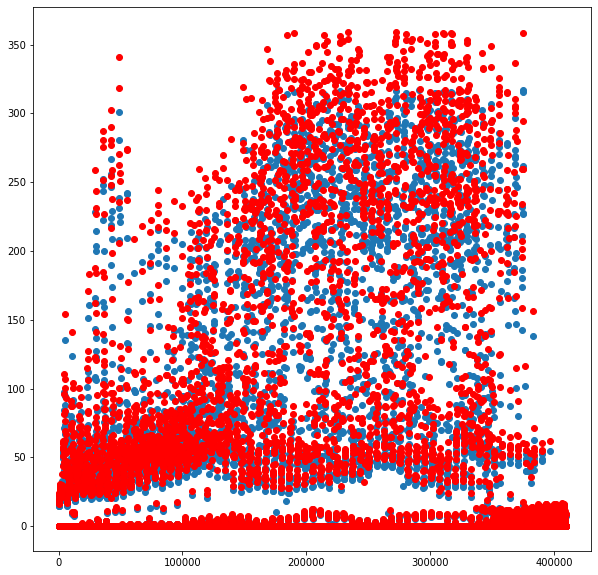

In [ ]:
import matplotlib.pyplot  as plt

plt.rcParams['figure.figsize'] = [10,10]
plt.scatter(IJ_2019.demand_point_index*100+IJ_2019.supply_point_index, IJ_2019.ds, label=IJ_2019.station)
plt.scatter(IJ_2020.demand_point_index*100+IJ_2020.supply_point_index, IJ_2020.ds, label=IJ_2020.station, color='red')
#plt.scatter(df_stations.x_coordinate, df_stations.y_coordinate,df_stations.capacity/20)

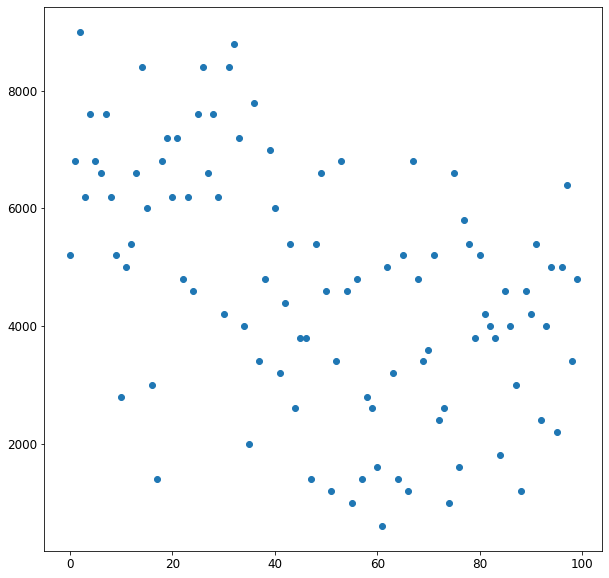

In [ ]:
plt.scatter(df_stations_2020.supply_point_index, df_stations_2020.capacity)

In [ ]:
df_demands.columns

Index(['demand_point_index', 'x_coordinate', 'y_coordinate', '2010', '2011',
       '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020'],
      dtype='object')

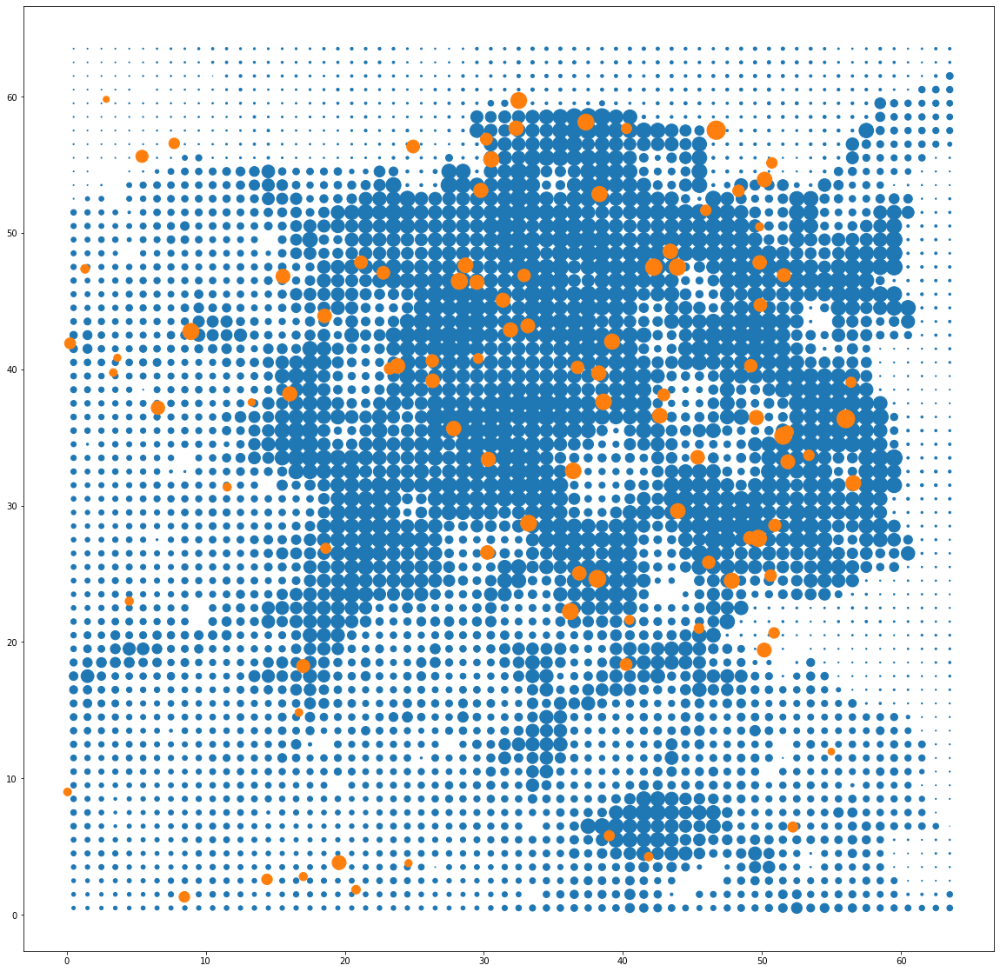

In [ ]:
plt.scatter(df_demands.x_coordinate, df_demands.y_coordinate, df_demands["2020"])
plt.scatter(df_stations.x_coordinate, df_stations.y_coordinate,df_stations.capacity/20)

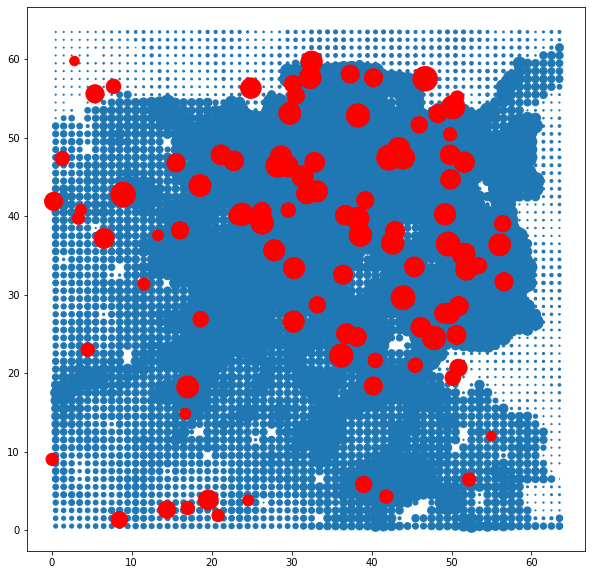

In [ ]:
plt.scatter(df_demands.x_coordinate, df_demands.y_coordinate, df_demands["2020"])
plt.scatter(df_stations.x_coordinate, df_stations.y_coordinate,(df_stations.existing_num_SCS+df_stations.existing_num_FCS)*30, color='red')
#plt.scatter(df_stations.x_coordinate, df_stations.y_coordinate,df_stations.total_parking_slots*30, color='green')

In [ ]:
plt.scatter(df_demands.x_coordinate, df_demands.y_coordinate, df_demands["2020"])
plt.scatter(df_stations.x_coordinate, df_stations.y_coordinate,df_stations.total_parking_slots*30)

In [ ]:
IJ_2020_full= IJ_2020.query("ds>0")

In [ ]:
IJ_2020.groupby("demand_point_index").sum().query("ds==0").shape

(62, 29)

In [ ]:
IJ_2020_full.shape

(4066, 31)

In [ ]:
IJ_2020_full.columns

Index(['demand_point_index', 'x_coordinate_x', 'y_coordinate_x', '2010',
       '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019',
       '2020', 'supply_point_index', 'x_coordinate_y', 'y_coordinate_y',
       'total_parking_slots', 'existing_num_SCS', 'existing_num_FCS',
       'existing_num_SCS_final', 'existing_num_FCS_final', 'capacity_used',
       'capacity', 'dist', 'ds', 'filled', 'station', 'data_type', 'year',
       'value'],
      dtype='object')

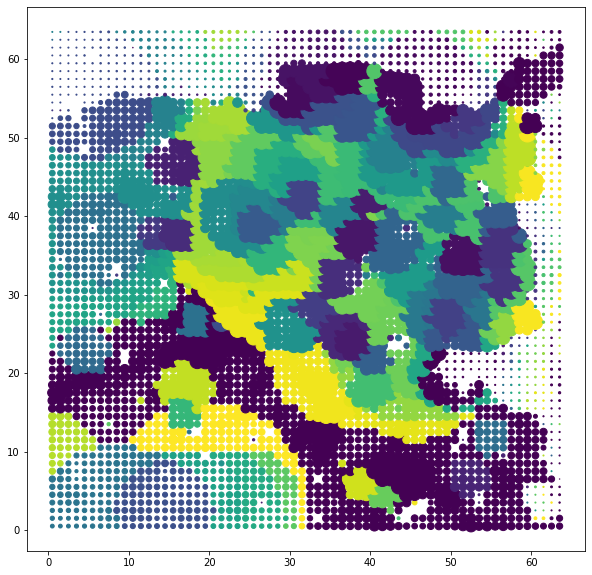

In [ ]:
plt.rcParams['figure.figsize'] = [10,10]
plt.rcParams.update({'font.size': 14})
plt.scatter(IJ_2020_full.x_coordinate_x,IJ_2020_full.y_coordinate_x, IJ_2020_full.ds, c=IJ_2020_full.station*255)
#plt.scatter(IJ_2020_full.x_coordinate_x, IJ_2020_full.y_coordinate_x, IJ_2020_full.ds)

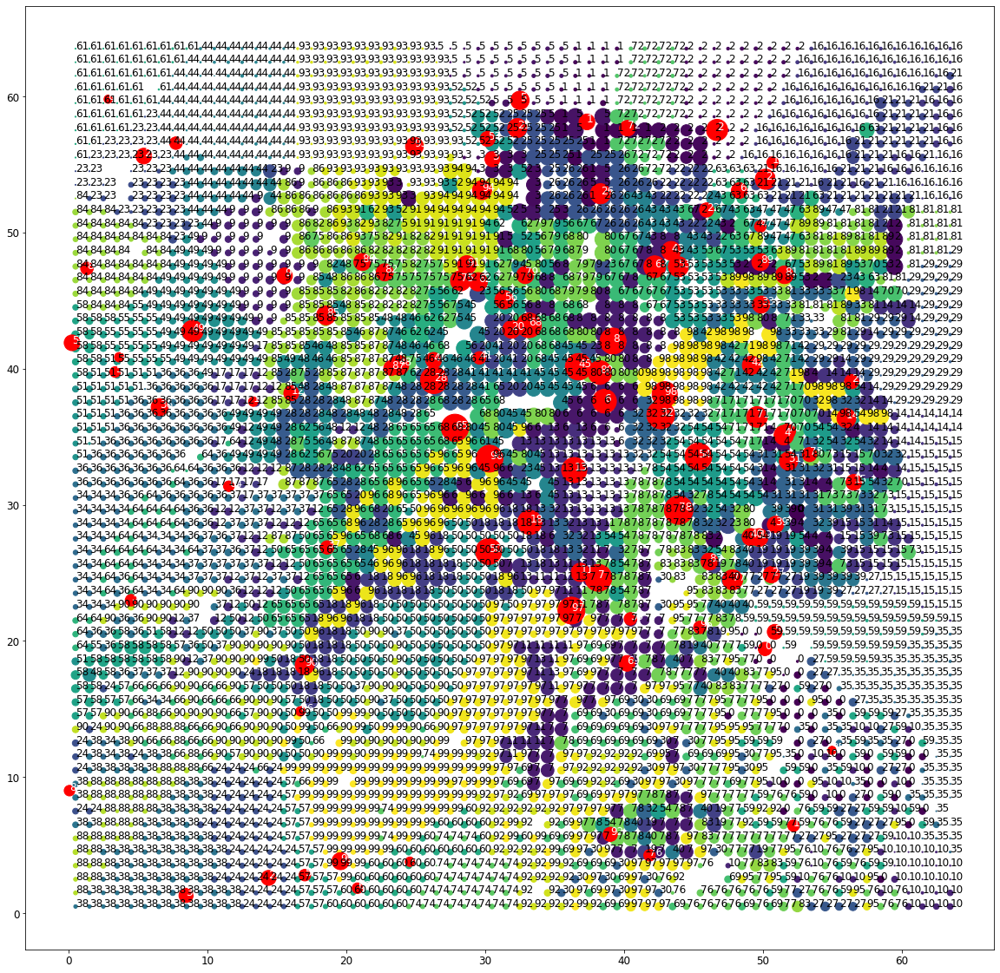

In [ ]:
plt.rcParams['figure.figsize'] = [20,20]
plt.rcParams.update({'font.size': 12})
plt.scatter(IJ_2020.x_coordinate_x,IJ_2020.y_coordinate_x, IJ_2020.ds, c=IJ_2020.station)
plt.scatter(df_stations_2020.x_coordinate, df_stations_2020.y_coordinate,(df_stations_2020.existing_num_SCS_final+df_stations_2020.existing_num_FCS_final)*30, color='red')
#plt.scatter(IJ_2020_full.x_coordinate_x, IJ_2020_full.y_coordinate_x, IJ_2020_full.ds)

for i, station in  df_stations_2020.iterrows():
  plt.text(station.x_coordinate, station.y_coordinate,station.supply_point_index, color='white')

for i, demand in  IJ_2020.query("ds!=0").iterrows():
  plt.text(demand.x_coordinate_x, demand.y_coordinate_x,demand.station, color='black')
#for i, demand in 


## Th truth

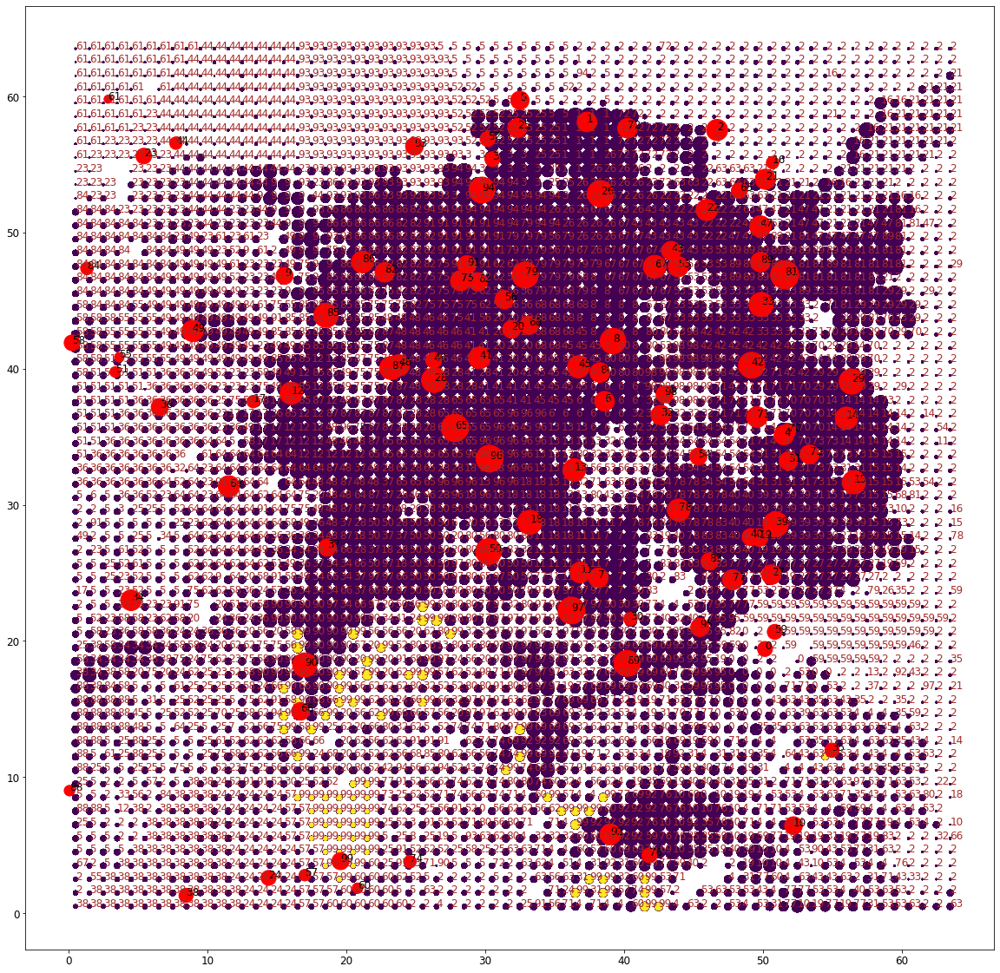

In [ ]:
plt.rcParams['figure.figsize'] = [20,20]
plt.rcParams.update({'font.size': 12})
plt.scatter(IJ_2020.x_coordinate_x,IJ_2020.y_coordinate_x, IJ_2020["2020"], c=IJ_2020.station)
plt.scatter(df_stations_2020.x_coordinate, df_stations_2020.y_coordinate,(df_stations_2020.existing_num_SCS_final+df_stations_2020.existing_num_FCS_final)*30, color='red')
#plt.scatter(IJ_2020_full.x_coordinate_x, IJ_2020_full.y_coordinate_x, IJ_2020_full.ds)

for i, station in  df_stations_2020.iterrows():
  plt.text(station.x_coordinate, station.y_coordinate,station.supply_point_index, color='black')

for i, demand in  IJ_2020.query("ds!=0 ").iterrows():
  plt.text(demand.x_coordinate_x, demand.y_coordinate_x,demand.station, color='brown')
#for i, demand in 


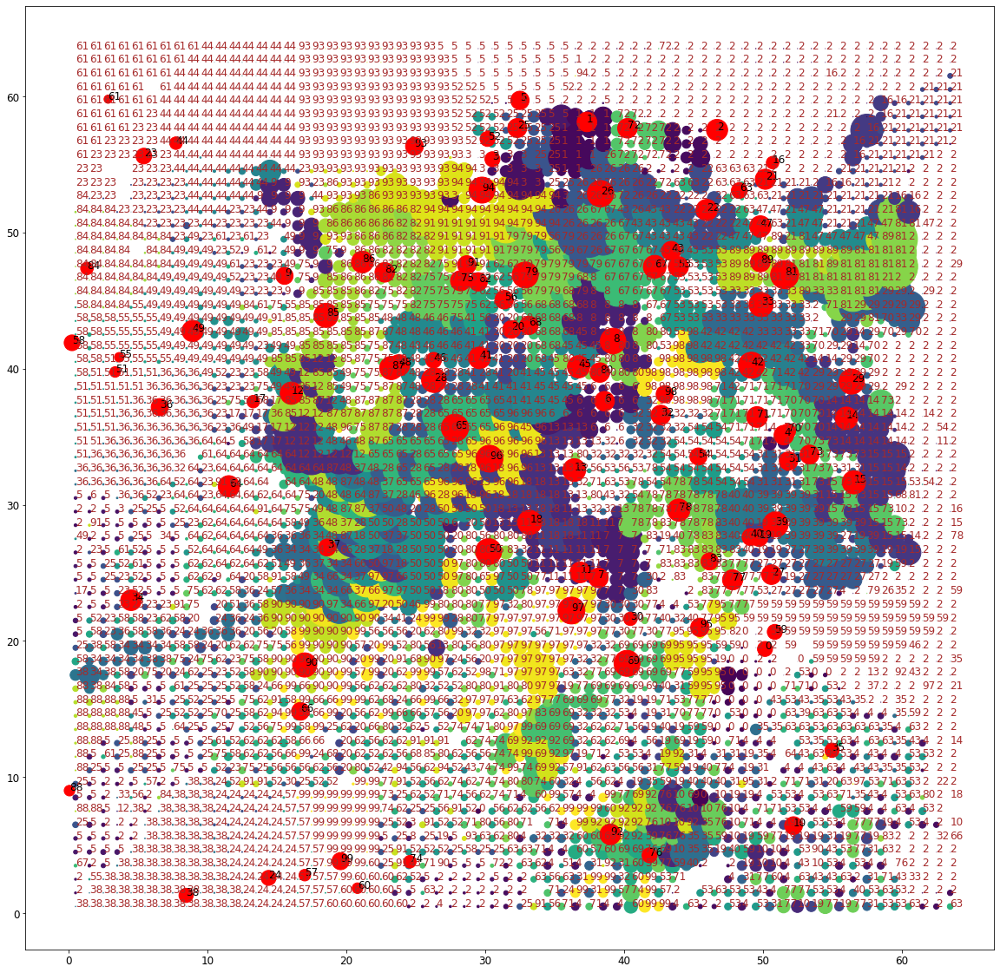

In [ ]:
plt.rcParams['figure.figsize'] = [20,20]
plt.rcParams.update({'font.size': 12})
plt.scatter(IJ_2020.x_coordinate_x,IJ_2020.y_coordinate_x, (IJ_2020.ds*IJ_2020.dist)/10**5, c=IJ_2020.station)
plt.scatter(df_stations_2020.x_coordinate, df_stations_2020.y_coordinate,(df_stations_2020.existing_num_SCS_final+df_stations_2020.existing_num_FCS_final)*30, color='red')
#plt.scatter(IJ_2020_full.x_coordinate_x, IJ_2020_full.y_coordinate_x, IJ_2020_full.ds)

for i, station in  df_stations_2020.iterrows():
  plt.text(station.x_coordinate, station.y_coordinate,station.supply_point_index, color='black')

for i, demand in  IJ_2020.query("ds!=0 ").iterrows():
  plt.text(demand.x_coordinate_x, demand.y_coordinate_x,demand.station, color='brown')
#for i, demand in 


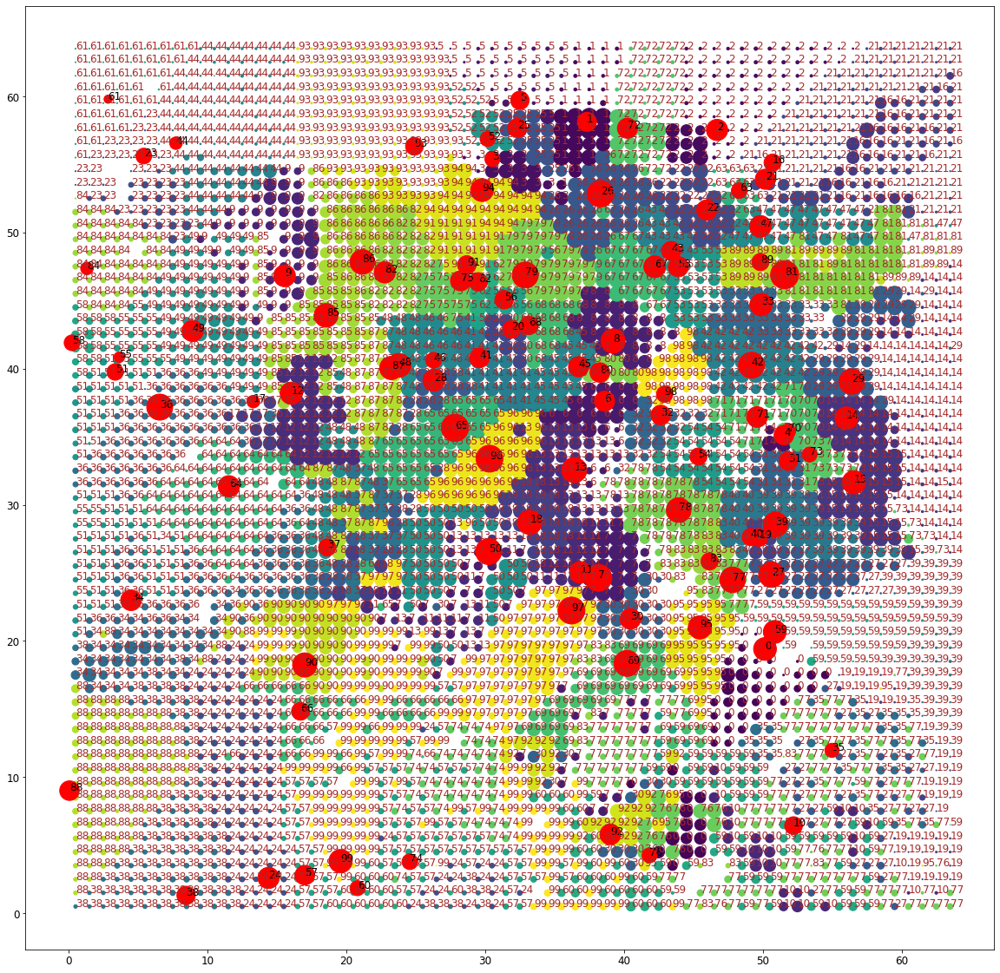

In [ ]:
plt.rcParams['figure.figsize'] = [20,20]
plt.rcParams.update({'font.size': 12})
plt.scatter(IJ_2020.x_coordinate_x,IJ_2020.y_coordinate_x, IJ_2020.ds, c=IJ_2020.station)
plt.scatter(df_stations_2020.x_coordinate, df_stations_2020.y_coordinate,(df_stations_2020.existing_num_SCS_final+df_stations_2020.existing_num_FCS_final)*30, color='red')
#plt.scatter(IJ_2020_full.x_coordinate_x, IJ_2020_full.y_coordinate_x, IJ_2020_full.ds)

for i, station in  df_stations_2020.iterrows():
  plt.text(station.x_coordinate, station.y_coordinate,station.supply_point_index, color='black')

for i, demand in  IJ_2020.query("ds!=0 ").iterrows():
  plt.text(demand.x_coordinate_x, demand.y_coordinate_x,demand.station, color='brown')
#for i, demand in 


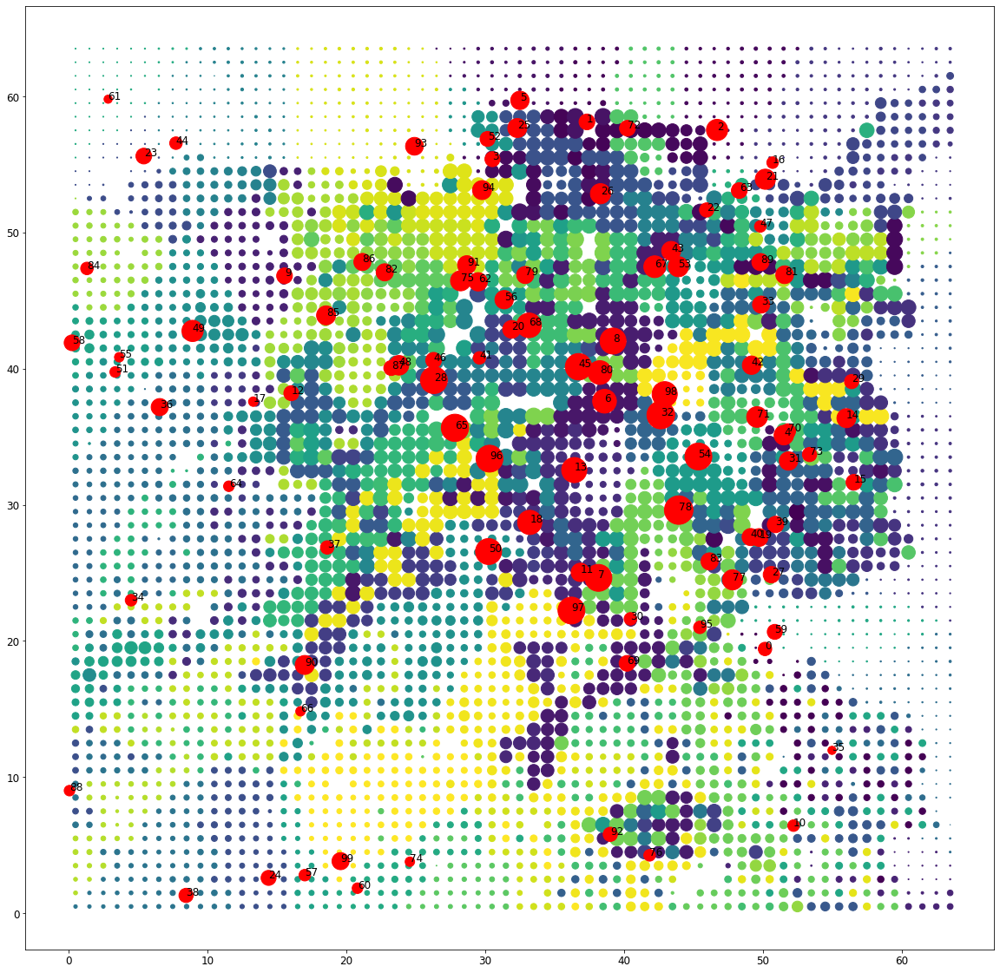

In [ ]:
plt.rcParams['figure.figsize'] = [20,20]
plt.rcParams.update({'font.size': 12})
scatter_ij=plt.scatter(IJ_2020.x_coordinate_x,IJ_2020.y_coordinate_x, IJ_2020.ds, c=IJ_2020.station, label=IJ_2020.station)
#plt.legend()
plt.scatter(df_stations_2020.x_coordinate, df_stations_2020.y_coordinate,(df_stations_2020.existing_num_SCS_final+df_stations_2020.existing_num_FCS_final)*30, color='red')

#plt.scatter(IJ_2020_full.x_coordinate_x, IJ_2020_full.y_coordinate_x, IJ_2020_full.ds)

for i, station in  df_stations_2020.iterrows():
  plt.text(station.x_coordinate, station.y_coordinate,station.supply_point_index, color='black')



In [ ]:
df_stations_2020.columns

Index(['supply_point_index', 'x_coordinate', 'y_coordinate',
       'total_parking_slots', 'existing_num_SCS', 'existing_num_FCS',
       'existing_num_SCS_final', 'existing_num_FCS_final', 'capacity_used',
       'capacity', 'dist_bar', 'demand_point_index', 'data_type', 'year',
       'value'],
      dtype='object')

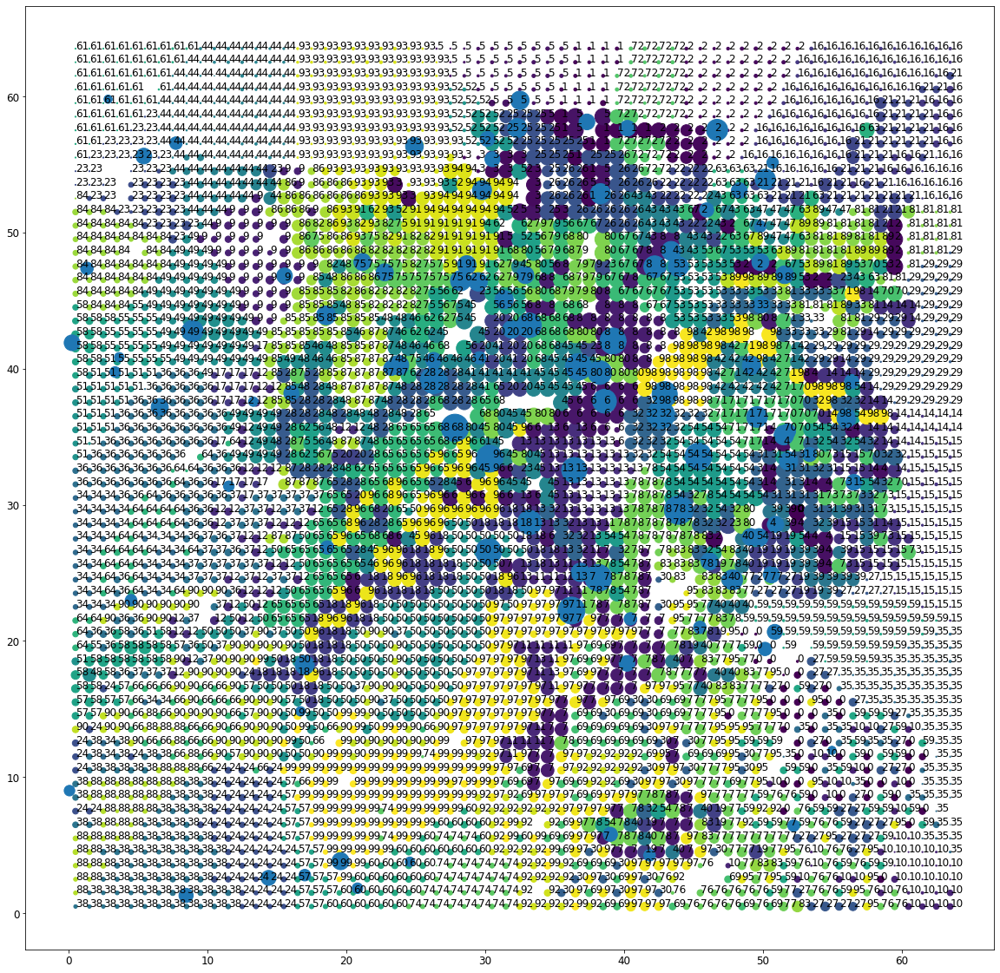

In [ ]:
plt.rcParams['figure.figsize'] = [20,20]
plt.rcParams.update({'font.size': 12})
plt.scatter(IJ_2020.x_coordinate_x,IJ_2020.y_coordinate_x, IJ_2020.ds, c=IJ_2020.station)
plt.scatter(df_stations_2020.x_coordinate, df_stations_2020.y_coordinate,(df_stations_2020.existing_num_SCS_final+df_stations_2020.existing_num_FCS_final)*30)
#plt.scatter(IJ_2020_full.x_coordinate_x, IJ_2020_full.y_coordinate_x, IJ_2020_full.ds)


for i, demand in  IJ_2020.query("ds!=0").iterrows():
  plt.text(demand.x_coordinate_x, demand.y_coordinate_x,demand.station, color='black')
#for i, demand in 

0      6
1     30
2     39
3     26
4     27
      ..
95     8
96    20
97    28
98    26
99    22
Length: 100, dtype: int64

In [ ]:
help(plt.scatter)

Help on function scatter in module matplotlib.pyplot:

scatter(x, y, s=None, c=None, marker=None, cmap=None, norm=None, vmin=None, vmax=None, alpha=None, linewidths=None, verts=<deprecated parameter>, edgecolors=None, *, plotnonfinite=False, data=None, **kwargs)
    A scatter plot of *y* vs. *x* with varying marker size and/or color.
    
    Parameters
    ----------
    x, y : scalar or array-like, shape (n, )
        The data positions.
    
    s : scalar or array-like, shape (n, ), optional
        The marker size in points**2.
        Default is ``rcParams['lines.markersize'] ** 2``.
    
    c : array-like or list of colors or color, optional
        The marker colors. Possible values:
    
        - A scalar or sequence of n numbers to be mapped to colors using
          *cmap* and *norm*.
        - A 2-D array in which the rows are RGB or RGBA.
        - A sequence of colors of length n.
        - A single color format string.
    
        Note that *c* should not be a single 

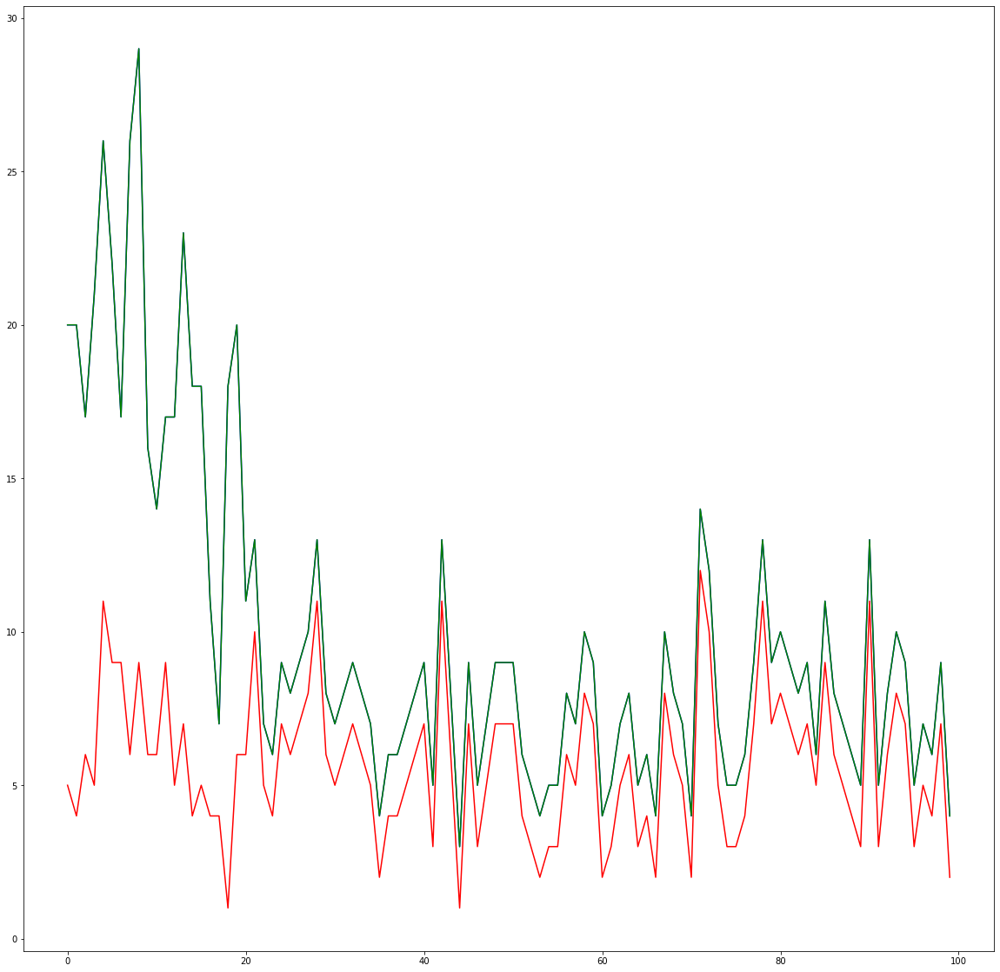

In [ ]:
plt.rcParams['figure.figsize'] = [20,20]
plt.plot(df_stations_2020.supply_point_index, df_stations_2020.existing_num_SCS_final,color='blue')
plt.plot(df_stations_2019.supply_point_index, df_stations_2019.existing_num_SCS_final, color="green")
plt.plot(df_stations.supply_point_index, df_stations.existing_num_SCS,color='red')


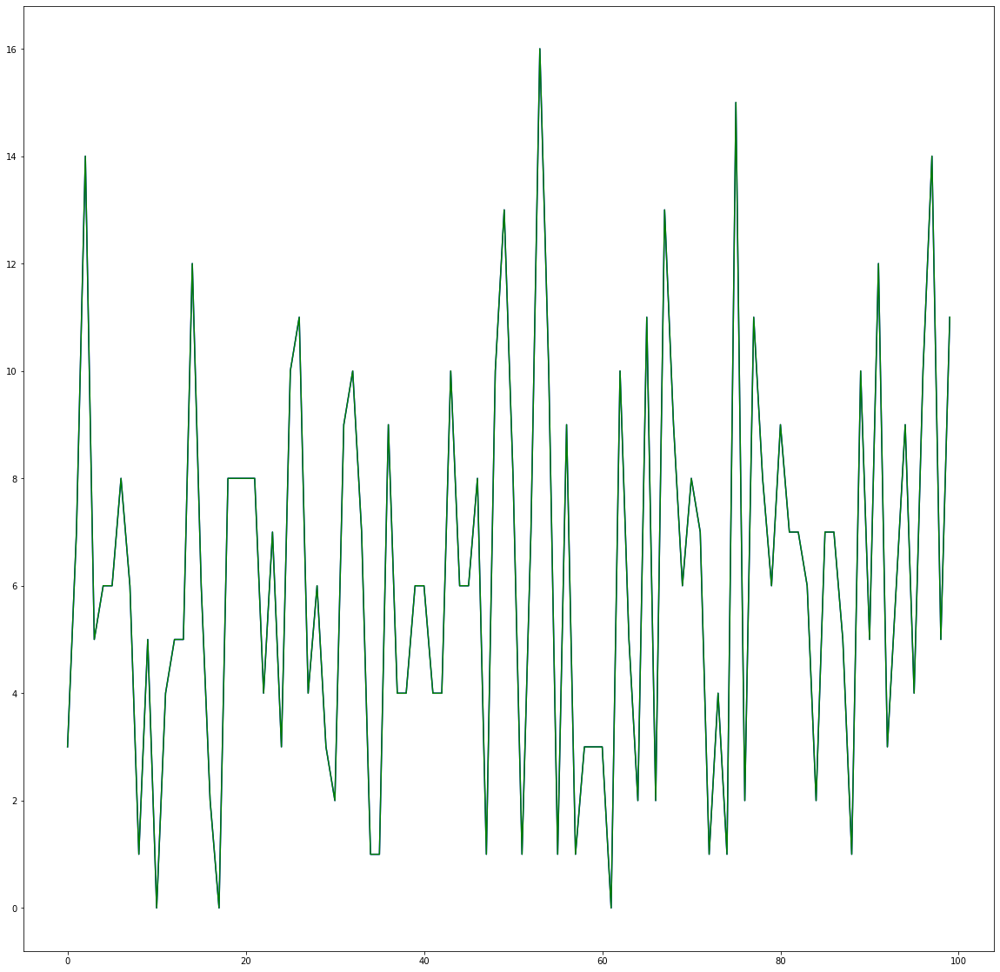

In [ ]:
plt.rcParams['figure.figsize'] = [20,20]
plt.plot(df_stations_2020.supply_point_index, df_stations_2020.existing_num_FCS_final,color='blue')
plt.plot(df_stations_2019.supply_point_index, df_stations_2019.existing_num_FCS_final, color="green")
#plt.plot(df_stations.supply_point_index, df_stations.existing_num_FCS,color='red')

In [ ]:
plt.rcParams['figure.figsize'] = [20,20]
plt.plot(df_stations_2020.supply_point_index, df_stations_2020.existing_num_FCS_final,color='blue')
plt.plot(df_stations_2019.supply_point_index, df_stations_2019.existing_num_FCS_final, color="green")

In [ ]:
plt.plot(df_demands.demand_point_index, df_demands["2020"],color='blue')
plt.plot(df_demands.demand_point_index ,  df_demands["2019"] ,color='red')

NameError: name 'plt' is not defined

In [ ]:
IJ_2020.groupby(["supply_point_index","capacity"]).sum().add_suffix('_count').reset_index() #.query("ds_count>value_count").shape

,supply_point_index,capacity,demand_point_index_count,x_coordinate_x_count,y_coordinate_x_count,2010_count,2011_count,2012_count,2013_count,2014_count,...,existing_num_SCS_count,existing_num_FCS_count,existing_num_SCS_final_count,existing_num_FCS_final_count,capacity_used_count,dist_count,ds_count,filled_count,station_count,value_count
0,0,2200,8386560,131072.0,131072.0,8164.579675,16457.592316,30935.239483,79148.62007,130628.452214,...,20480,12288,20480,12288,0.0,127009.343818,5242.583302,4094,0,5242.583302
1,1,3600,8386560,131072.0,131072.0,8164.579675,16457.592316,30935.239483,79148.62007,130628.452214,...,16384,28672,16384,28672,0.0,139154.084879,6817.386516,4094,39,6817.386516
2,2,6800,8386560,131072.0,131072.0,8164.579675,16457.592316,30935.239483,79148.62007,130628.452214,...,24576,57344,24576,57344,0.0,146768.352922,9065.504702,4094,266,9065.504702
3,3,3000,8386560,131072.0,131072.0,8164.579675,16457.592316,30935.239483,79148.62007,130628.452214,...,20480,20480,20480,20480,0.0,130599.960179,6216.203914,4094,117,6216.203914
4,4,4600,8386560,131072.0,131072.0,8164.579675,16457.592316,30935.239483,79148.62007,130628.452214,...,45056,24576,45056,24576,0.0,121998.669876,7617.128858,4094,144,7617.128858
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,95,2200,8386560,131072.0,131072.0,8164.579675,16457.592316,30935.239483,79148.62007,130628.452214,...,12288,16384,12288,16384,0.0,117020.282989,2614.705767,4094,3230,2614.705767
96,96,5000,8386560,131072.0,131072.0,8164.579675,16457.592316,30935.239483,79148.62007,130628.452214,...,20480,40960,20480,40960,0.0,100554.433778,5428.914638,4094,6144,5428.914638
97,97,6400,8386560,131072.0,131072.0,8164.579675,16457.592316,30935.239483,79148.62007,130628.452214,...,16384,57344,16384,57344,0.0,106632.167454,6830.295014,4094,6596,6830.295014
98,98,3400,8386560,131072.0,131072.0,8164.579675,16457.592316,30935.239483,79148.62007,130628.452214,...,28672,20480,28672,20480,0.0,109069.619081,3834.237541,4094,7350,3834.237541


In [ ]:
df_stations_2020.capacity

0     5200
1     6800
2     9000
3     6200
4     7600
      ... 
95    3000
96    5800
97    7200
98    4200
99    5600
Name: capacity, Length: 100, dtype: int64

468232.0637302474